# <center><span style="color:#FF7F50"><u> SDA - Projet 3 Text Mining : Suivi du #Ukraine</u><br><br>*Anne - Alicia - Julie - Valentina *</span></center>
***

## <span style="color:#191970"> Objectif :</span>
L’objectif de ce projet est de produire une analyse des tweets en français sur la guerre russo-ukrainienne de 2022.<br><br>
Pour cela : produire une analyse descriptive des tweets collectés et utiliser des modèles de Machine Learning pour essayer de faire émerger les grandes thématiques évoquées et suivre leur évolution.

## <span style="color:#191970">Import des packages</span>

In [1]:
pip install langdetect

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install unidecode

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.9/235.9 kB 9.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install nltk

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install wordcloud

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 458.6/458.6 kB 7.3 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install git+https://github.com/ClaudeCoulombe/FrenchLefffLemmatizer.git

  Cloning https://github.com/ClaudeCoulombe/FrenchLefffLemmatizer.git to /tmp/pip-req-build-9g82t14p
  Running command git clone --filter=blob:none --quiet https://github.com/ClaudeCoulombe/FrenchLefffLemmatizer.git /tmp/pip-req-build-9g82t14p
  Resolved https://github.com/ClaudeCoulombe/FrenchLefffLemmatizer.git to commit bc0ebd0135a6cc78f48ddf184069b4c0b9c017d8
  Preparing metadata (setup.py) ... done
  Created wheel for FrenchLefffLemmatizer: filename=FrenchLefffLemmatizer-0.3-py3-none-any.whl size=3533513 sha256=048302d4bf255c87b9331c0f7de8fc69dabb14e3203b839232433c6c9ac398d6
  Stored in directory: /tmp/pip-ephem-wheel-cache-vdqj8pv4/wheels/98/2a/68/fa037d302c091a60390195bc19da0a9eb835ff105dbee42c7d
Successfully built FrenchLefffLemmatizer
Note: you may need to restart the kernel to use updated packages.


In [1]:
import os
path = "C:/Users/vnarv/PycharmProjects/twitter_text_mining/"
os.chdir(path)

In [2]:
import re
import time
from collections import Counter

import matplotlib.pyplot as plt
import nltk
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from french_lefff_lemmatizer.french_lefff_lemmatizer import \
    FrenchLefffLemmatizer
from langdetect import DetectorFactory, detect
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from unidecode import unidecode
from wordcloud import WordCloud

from notebooks.utils import (get_tfidf_top_features, get_top_n_words,
                             ngram_top, wordcloud_cols)
from src.model.modelling import *
from src.preprocessing.preprocessing import preprocessing
from src.preprocessing.tools_preprocessing import read_files, transform_dates

C:\Users\vnarv\anaconda3\lib\site-packages\scipy\sparse\sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


In [3]:
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns
# import plotly.express as px
# from wordcloud import WordCloud
# import plotly.graph_objects as go
# import os
# import re
# import nltk
# from nltk.corpus import stopwords
# from langdetect import detect, DetectorFactory
# from unidecode import unidecode
# from nltk.stem import SnowballStemmer
# from sklearn.feature_extraction.text import CountVectorizer
# from french_lefff_lemmatizer.french_lefff_lemmatizer import FrenchLefffLemmatizer
# from collections import Counter
# import os
# import time

# from src.preprocessing.preprocessing import preprocessing
# from src.preprocessing.tools_preprocessing import (
#     read_files, transform_dates, transform_dates
# )

# from notebooks.utils import (
#     get_top_n_words,
#     ngram_top,
#     wordcloud_cols,
#     get_tfidf_top_features
# )
# from src.model.modelling import *

## <span style="color:#191970">1. Import des données</span>

In [4]:
data = read_files(os.path.join(path, "data/min_retweet_10/"))

C:\Users\vnarv\PycharmProjects\twitter_text_mining


## <span style="color:#191970">2. Analyse exploratoire</span>

### <span style="color:#191970">2.1. Description des données</span>

#### <span style="color:#191970">Types de variables</span>

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19939 entries, 0 to 19938
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   datetime       19939 non-null  object
 1   tweet_id       19939 non-null  int64 
 2   text           19939 non-null  object
 3   username       19939 non-null  object
 4   like_count     19939 non-null  int64 
 5   retweet_count  19939 non-null  int64 
 6   reply_count    19939 non-null  int64 
 7   quote_count    19939 non-null  int64 
dtypes: int64(5), object(3)
memory usage: 1.2+ MB


In [6]:
data.dtypes

datetime         object
tweet_id          int64
text             object
username         object
like_count        int64
retweet_count     int64
reply_count       int64
quote_count       int64
dtype: object

In [7]:
data.head()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count
0,2022-02-01 08:44:30+00:00,1488433061196812291,"Voilà l'info, malheureusement très peu reprise...",tcabarrus,58,33,2,0
1,2022-02-01 09:42:34+00:00,1488447673883676672,#Ukraine Face à Poutine ... Macron hausse le t...,lapin47,230,103,36,24
2,2022-02-01 12:43:38+00:00,1488493240475078658,Crise en #Ukraine : « Emmanuel #Macron et Vlad...,FaireEnsembleEM,63,17,6,0
3,2022-02-01 13:20:13+00:00,1488502446771081216,La #Russie c'est l'équivalent du PIB de l'Ital...,BrunoRetailleau,59,29,9,1
4,2022-02-01 13:56:13+00:00,1488511509961527302,Crise en #Ukraine : voilà pourquoi il faut sor...,f_philippot,745,236,34,5


In [8]:
data.tail()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count
19934,2022-07-01 20:23:10+00:00,1542967067611127813,C'est magnifique et tellement émouvant 🥰🇺🇦🇪🇺 #...,Anna78__,57,20,2,2
19935,2022-07-01 20:10:32+00:00,1542963887175335937,👉 Guerre un #Ukraine : que faire pour aider le...,LCI,136,59,171,28
19936,2022-07-01 20:39:44+00:00,1542971236459888641,👉 Guerre en #Ukraine : le soft power des résea...,LCI,54,28,38,4
19937,2022-07-01 20:31:01+00:00,1542969041161158656,Implacable. A gauche le peuple d’#Ukraine qui ...,PJakubowicz,948,438,265,25
19938,2022-07-01 21:21:38+00:00,1542981780092985344,Les urgences d'un hôpital ferment faute de soi...,LeDucDeLaToile,19,13,0,1


#### <span style="color:#191970">Recherche de doublons</span>

In [9]:
#nb de doublons
print(f"La base contient {data.duplicated().sum()} doublons.")

La base contient 0 doublons.


#### <span style="color:#191970">Refiltre sur tweets restants en anglais</span>

In [10]:
# lower case tweets
data["text"] = data["text"].str.lower()

# store all hashtags into a column
data["hashtags"] = data["text"].apply(lambda y: [x.group() for x in re.finditer(r'#[a-zA-Z]+', y)])

# Find all @
data["arrobas"] = data["text"].apply(lambda y: [x.group() for x in re.finditer(r'@[a-zA-Z]+', y)])

# replace https links with "link"
regex_http = r'([\w+]+\:\/\/)?([\w\d-]+\.)*[\w-]+[\.\:]\w+([\/\?\=\&\#\.]?[\w-]+)*\/?'

#data["text_clean"] = [re.sub(regex_http, '<link>', doc) for doc in data["text"]]
data["text_clean"] = [re.sub(regex_http, '', doc) for doc in data["text"]]
#en enlevant les accents et emoji : plus de tweets déclarés en anglais à tord => on garde les accents


In [11]:
data.head()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count,hashtags,arrobas,text_clean
0,2022-02-01 08:44:30+00:00,1488433061196812291,"voilà l'info, malheureusement très peu reprise...",tcabarrus,58,33,2,0,"[#medias, #emmanuelmacron, #vladimirpoutine, #...",[],"voilà l'info, malheureusement très peu reprise..."
1,2022-02-01 09:42:34+00:00,1488447673883676672,#ukraine face à poutine ... macron hausse le t...,lapin47,230,103,36,24,[#ukraine],[],#ukraine face à poutine ... macron hausse le t...
2,2022-02-01 12:43:38+00:00,1488493240475078658,crise en #ukraine : « emmanuel #macron et vlad...,FaireEnsembleEM,63,17,6,0,"[#ukraine, #macron, #poutine]",[@gabrielattal],crise en #ukraine : « emmanuel #macron et vlad...
3,2022-02-01 13:20:13+00:00,1488502446771081216,la #russie c'est l'équivalent du pib de l'ital...,BrunoRetailleau,59,29,9,1,"[#russie, #kiev, #ukraine]",[],la #russie c'est l'équivalent du pib de l'ital...
4,2022-02-01 13:56:13+00:00,1488511509961527302,crise en #ukraine : voilà pourquoi il faut sor...,f_philippot,745,236,34,5,[#ukraine],[],crise en #ukraine : voilà pourquoi il faut sor...


In [12]:
# refiltre sur tweets restants en anglais
tweet_lg = []
for row in data.text_clean :
    tw_lang = detect(row)
    tweet_lg.append(tw_lang)
    
# créatio d'une colonne contenant la langue
data["language"] = tweet_lg

other_lang = data[data["language"] != "fr"]
nb_other_lang = other_lang.groupby("language")["tweet_id"].nunique()
print(f"Nb of tweets detected in other language {nb_other_lang}")
print(other_lang[["text_clean", "language"]].iloc[:10])
        
# Filtrer les tweets en français
is_french = "fr"
data = data[data["language"] == is_french]

# delete accents and emojis
data["text_clean"] = data["text_clean"].apply(lambda x: unidecode(x))
# replace all non alphabetic chars with an space
data["text_clean"] = data["text_clean"].apply(lambda x: re.sub(r"[^a-z]+", " ", x))
# delete empty tweets
data = data[(data["text_clean"] != " ")]
# delete any nan values
data = data[~data["text_clean"].isna()]


Nb of tweets detected in other language language
af     4
ca     2
cs     1
da     1
de     5
en    41
et     6
fi    10
hr     4
id     3
it     9
lt     2
lv     1
nl     4
no     4
pl     1
sk     1
sl     5
sv     1
Name: tweet_id, dtype: int64
                                             text_clean language
192   spanish minister of foreign affairs josé manue...       en
386   #g7 finance ministers´ statement on #ukraine ➡...       nl
1148  ukraine foreign ministry recalls chargé d'affa...       en
1502       explosions in kyiv  via @neilphauer #ukraine       fi
1540                         chaos in kharkov #ukraine        sl
1551                   sirens in #kiev\r\n\r\n#ukraine        sl
1580  #ukrainewar \r\n#russianattack \r\nattaques ma...       en
1741  je poste cela \r\n#ukraine #ukraineconflict #u...       pl
2024  quartier de kharkiv ce matin\r\n#украинская #в...       et
2036  un hélicoptères russe abattu près de #gostomel...       ca


In [13]:
data.head()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count,hashtags,arrobas,text_clean,language
0,2022-02-01 08:44:30+00:00,1488433061196812291,"voilà l'info, malheureusement très peu reprise...",tcabarrus,58,33,2,0,"[#medias, #emmanuelmacron, #vladimirpoutine, #...",[],voila l info malheureusement tres peu reprise ...,fr
1,2022-02-01 09:42:34+00:00,1488447673883676672,#ukraine face à poutine ... macron hausse le t...,lapin47,230,103,36,24,[#ukraine],[],ukraine face a poutine macron hausse le ton,fr
2,2022-02-01 12:43:38+00:00,1488493240475078658,crise en #ukraine : « emmanuel #macron et vlad...,FaireEnsembleEM,63,17,6,0,"[#ukraine, #macron, #poutine]",[@gabrielattal],crise en ukraine emmanuel macron et vladimir p...,fr
3,2022-02-01 13:20:13+00:00,1488502446771081216,la #russie c'est l'équivalent du pib de l'ital...,BrunoRetailleau,59,29,9,1,"[#russie, #kiev, #ukraine]",[],la russie c est l equivalent du pib de l itali...,fr
4,2022-02-01 13:56:13+00:00,1488511509961527302,crise en #ukraine : voilà pourquoi il faut sor...,f_philippot,745,236,34,5,[#ukraine],[],crise en ukraine voila pourquoi il faut sortir...,fr


### <span style="color:#191970">2.2. Statistiques globales</span>

#### <span style="color:#191970">Evolution nb de tweets</span>

In [14]:
data = transform_dates(df=data, column="datetime")

In [15]:
data['date'].min()

datetime.date(2022, 2, 1)

In [16]:
data['date'].max()

datetime.date(2022, 7, 1)

In [17]:
#evolution nb de tweet par jour 
#tpd=nb tweets per day
tpd = data.groupby("date")["tweet_id"].count().reset_index()
display(tpd)

,date,tweet_id
0,2022-02-01,12
1,2022-02-02,12
2,2022-02-03,13
3,2022-02-04,21
4,2022-02-05,7
...,...,...
146,2022-06-27,70
147,2022-06-28,58
148,2022-06-29,42
149,2022-06-30,42


In [18]:
#line plot evolution du nb de tweets par jour
fig = px.line(tpd,
              x='date',
              y='tweet_id',
              title='Evolution du nb de tweets par jour', 
              labels={
                     "tweet_id": "Nb de tweets"
                 })
fig.show()

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



Pic du nombre de tweets sur 5 jours à partir du début de la guerre le 24 février 2021, jusqu'au 1er mars 2021, puis une phase de décroissance significative du nombre de tweets par jour durant un mois, pour se stabiliser sur une moyenne d'une cinquantaine de tweets par jour.

22/02 : Russie reconnaît l'indépendance des territoires séparatistes dans le Donbass (indépendance de la république populaire de Donetsk et de la république populaire de Lougansk)<br>
24/02 : la guerre éclate<br>
27/02 : Russie menace nucléaire / UE envoie des armes à l'Ukraine <br>
09/03 : une maternité bombardée à Marioupol <br>
13/03 : Russie bombarde une base Ukrainienne vers la Pologne <br>
16/03 : Russie exclue du Conseil de l'Europe / Un théâtre abritant "des centaines de civils" visé par une frappe aérienne russe dans le port assiégé de Marioupol / Joe Biden, a qualifié Poutine de "criminel de guerre"<br>
24/03 : changement de stratégie du Kremlin<br>
pics 03-04-05/04 : Fin mars, l’échec de l’offensive russe sur Kiev / démonstration de force de la Russie / les crimes russes découverts à Boutcha<br>
14/04 : le « Moskva » coule<br>
23/04 : retrait des troupes russes<br>
30/05 : embargo officiel sur le pétrole russe<br>
16/06 : Visite des présidents français, allemand et italien<br>

#### <span style="color:#191970">Stats descriptives - variables numériques</span>

In [19]:
count_var = ['like_count','retweet_count','reply_count','quote_count']
data[count_var].describe()

,like_count,retweet_count,reply_count,quote_count
count,19834.000000,19834.000000,19834.000000,19834.000000
mean,368.026873,91.925935,25.032469,11.807351
std,1825.753715,299.339677,84.849299,84.863562
min,1.000000,3.000000,0.000000,0.000000
25%,39.000000,20.000000,2.000000,1.000000
50%,72.000000,31.000000,6.000000,2.000000
75%,172.000000,62.000000,17.000000,5.000000
max,76494.000000,15137.000000,3512.000000,6546.000000


En moyenne un tweet est liké 373 fois et peut aller jusqu'à un maximum de 76494 like. <br>
Par ailleurs, un tweet est retweeté 93 fois en moyenne et peut être retweeté au maximum 15137 fois.<br>
Les tweets les plus populaires sont les tweets de "libe", les plus likés et les plus retweetés sont de Mediapart.

In [20]:
data['username'].value_counts()

libe            550
LCI             493
tcabarrus       493
CerfiaFR        428
CedricMas       360
               ... 
AcadSciences      1
nadisou6965       1
yas_laetitia      1
PSSuisse          1
bitznarweb        1
Name: username, Length: 4304, dtype: int64

In [21]:
# classement des username qui sont le plus retweetés
# tpu = tweets per user
tpu = data.groupby("username")["tweet_id"].count().reset_index()
tpu = tpu.sort_values(by='tweet_id', ascending=False)

In [22]:
tpu.reset_index(drop=True, inplace=True)

In [23]:
tpu_20 = tpu.iloc[0:20]

In [24]:
#20 premiers usernames qui ont été le plus retweetés 
tpu_20

,username,tweet_id
0,libe,550
1,LCI,493
2,tcabarrus,493
3,CerfiaFR,428
4,CedricMas,360
5,France24_fr,296
6,le_Parisien,285
7,Le_Figaro,232
8,CorentinSellin,205
9,francediplo,187


In [25]:
#20 premiers "tweeters" sur la période
fig3 = px.bar(tpu_20,
              x='tweet_id',
              y='username',
              orientation='h',
              title='Top 20 des tweets dans le périmètre',
              labels={
                     "tweet_id": "Nb de tweets"
                 }
             )
fig3.show()

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



Dans les premiers username qui sont le plus retweetés, on retrouve beaucoup de grands journaux/médias tels que Libé, LCI, France24, Le Parisien mais aussi des personalités comme des journalistes tels que Thierry de Cabarrus (tcabarrus) ou encore des historiens comme Cedric Mas ou Corentin Sellin.

#### <span style="color:#191970">Distributions - variables numériques</span>

In [26]:
#Boxplots - Distribution des données
fig = go.Figure()

fig.add_trace(go.Box(x=data["like_count"], name="like_count"))
fig.add_trace(go.Box(x=data["retweet_count"], name="retweet_count"))
fig.update_layout(
    title="Distribution des retweets et des likes dans le périmètre"
)
fig.show()

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [27]:
data[data['like_count']>50000].sort_values(by='retweet_count', ascending=False).head()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count,hashtags,arrobas,text_clean,language,date,day,month,time,hour,minute
16037,2022-04-14 08:46:00+00:00,1514525365158436866,🇺🇳 flash - le directeur général de l'#oms esti...,Mediavenir,58690,15137,845,1378,"[#oms, #ukraine]",[],flash le directeur general de l oms estime qu...,fr,2022-04-14,14,4,08:46:00,8,46
15907,2022-04-12 11:54:30+00:00,1513848028289019906,"🇺🇦 le mot ""macroner"" est né en #ukraine. défin...",Mediavenir,51724,9649,560,1306,"[#ukraine, #macron]",[],le mot macroner est ne en ukraine definition ...,fr,2022-04-12,12,4,11:54:30,11,54
11934,2022-03-14 15:33:55+00:00,1503393999452786690,🇺🇸🇷🇺 insolite : elon musk défie vladimir #pout...,Mediavenir,76494,8731,1196,3022,"[#poutine, #ukraine]",[],insolite elon musk defie vladimir poutine dan...,fr,2022-03-14,14,3,15:33:55,15,33
3124,2022-02-25 10:16:20+00:00,1497153481525936128,💻🇷🇺 flash - le collectif de hackers #anonymous...,Mediavenir,69192,7424,685,1178,"[#anonymous, #russie, #ukraine, #laguerre, #uk...",[],flash le collectif de hackers anonymous a dec...,fr,2022-02-25,25,2,10:16:20,10,16


In [28]:
data[data['like_count']>50000].sort_values(by='like_count', ascending=False).head()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count,hashtags,arrobas,text_clean,language,date,day,month,time,hour,minute
11934,2022-03-14 15:33:55+00:00,1503393999452786690,🇺🇸🇷🇺 insolite : elon musk défie vladimir #pout...,Mediavenir,76494,8731,1196,3022,"[#poutine, #ukraine]",[],insolite elon musk defie vladimir poutine dan...,fr,2022-03-14,14,3,15:33:55,15,33
3124,2022-02-25 10:16:20+00:00,1497153481525936128,💻🇷🇺 flash - le collectif de hackers #anonymous...,Mediavenir,69192,7424,685,1178,"[#anonymous, #russie, #ukraine, #laguerre, #uk...",[],flash le collectif de hackers anonymous a dec...,fr,2022-02-25,25,2,10:16:20,10,16
16037,2022-04-14 08:46:00+00:00,1514525365158436866,🇺🇳 flash - le directeur général de l'#oms esti...,Mediavenir,58690,15137,845,1378,"[#oms, #ukraine]",[],flash le directeur general de l oms estime qu...,fr,2022-04-14,14,4,08:46:00,8,46
15907,2022-04-12 11:54:30+00:00,1513848028289019906,"🇺🇦 le mot ""macroner"" est né en #ukraine. défin...",Mediavenir,51724,9649,560,1306,"[#ukraine, #macron]",[],le mot macroner est ne en ukraine definition ...,fr,2022-04-12,12,4,11:54:30,11,54


Les tweets les plus likés, retweetés, quotés et commentés sont les tweets de Mediavenir

#### <span style="color:#191970">Répartition des tweets/tranches de like</span>

In [29]:
tranches_like = [
    (data['like_count'] > 1000) ,
    (data['like_count'] > 200) & (data['like_count'] <= 1000),
    (data['like_count'] > 100) & (data['like_count'] <= 200),
    (data['like_count'] > 50) & (data['like_count'] <= 100),
    (data['like_count'] > 10) & (data['like_count'] <= 50),
    (data['like_count'] > 0) & (data['like_count'] <= 10),
    (data['like_count'] == 0)
]
choicelist = [">1000 likes", "[201-1000 likes]", "[101-200 likes]", "[51-100 likes]", "[11-50 likes]", "[1-10 likes]", "0 like"]
data['tranches_like'] = np.select(tranches_like, choicelist, default='Not Specified')

In [32]:
data.head()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count,hashtags,arrobas,text_clean,language,date,day,month,time,hour,minute,tranches_like
0,2022-02-01 08:44:30+00:00,1488433061196812291,"voilà l'info, malheureusement très peu reprise...",tcabarrus,58,33,2,0,"[#medias, #emmanuelmacron, #vladimirpoutine, #...",[],voila l info malheureusement tres peu reprise ...,fr,2022-02-01,1,2,08:44:30,8,44,[51-100 likes]
1,2022-02-01 09:42:34+00:00,1488447673883676672,#ukraine face à poutine ... macron hausse le t...,lapin47,230,103,36,24,[#ukraine],[],ukraine face a poutine macron hausse le ton,fr,2022-02-01,1,2,09:42:34,9,42,[201-1000 likes]
2,2022-02-01 12:43:38+00:00,1488493240475078658,crise en #ukraine : « emmanuel #macron et vlad...,FaireEnsembleEM,63,17,6,0,"[#ukraine, #macron, #poutine]",[@gabrielattal],crise en ukraine emmanuel macron et vladimir p...,fr,2022-02-01,1,2,12:43:38,12,43,[51-100 likes]
3,2022-02-01 13:20:13+00:00,1488502446771081216,la #russie c'est l'équivalent du pib de l'ital...,BrunoRetailleau,59,29,9,1,"[#russie, #kiev, #ukraine]",[],la russie c est l equivalent du pib de l itali...,fr,2022-02-01,1,2,13:20:13,13,20,[51-100 likes]
4,2022-02-01 13:56:13+00:00,1488511509961527302,crise en #ukraine : voilà pourquoi il faut sor...,f_philippot,745,236,34,5,[#ukraine],[],crise en ukraine voila pourquoi il faut sortir...,fr,2022-02-01,1,2,13:56:13,13,56,[201-1000 likes]


In [33]:
data.to_csv('./output/df_fr.csv', index=False)

In [35]:
data['tranches_like'].value_counts(normalize=True)

[11-50 likes]       0.347635
[51-100 likes]      0.256781
[201-1000 likes]    0.166784
[101-200 likes]     0.163709
>1000 likes         0.055158
[1-10 likes]        0.009932
Name: tranches_like, dtype: float64

In [36]:
#Histogramme de répartition des tweets par tranche de like
data = data.sort_values("like_count", ascending=True)
fig = px.histogram(data, x="tranches_like",
                   title="Histogramme de répartition des tweets par tranche de like",
                   labels={
                     "count": "Nb de tweets"
                 })
fig.show()

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



La plupart des tweets sont likés entre 11 et 100 fois (un tiers des tweets de la base) et 25% entre 50 et 100 fois.<br>
Très peu de tweets sont likés plus de 1000 fois : 6%.

#### <span style="color:#191970">Nuages de mots</span>

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\vnarv\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


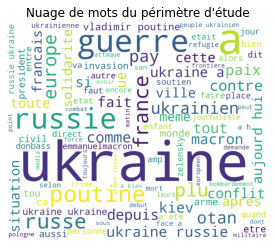

In [37]:
#Nuage de mots - tous tweets
nltk.download('stopwords')
stopwords_set = set(stopwords.words('french')) 
wordcloud = WordCloud(background_color='white',
                           collocations=True, # Inclu les bigrammes
                           width=1200,
                           height=1000,
                           max_words=100,
                           stopwords=stopwords_set).generate(" ".join(data['text_clean']))

plt.title("Nuage de mots du périmètre d'étude")
plt.axis("off")
plt.imshow(wordcloud)
plt.savefig("wordcloud_general.png")

On peut voir des mots évoquant le soutien des autres Nations à l'Ukraine avec notamment : "paix", "soutien", "Europe", "France", "monde", "Otan", "sanction". <br>
On peut également voir des noms de villes qui ont fait l'actualité, ressortir et notamment "Khiev", "Donbass", "Kyiv" ou "Marioupol". <br>
On peut aussi voir des mots comme "crime", "mort", "militaire" ou "bombardement" qui témoignent de la situation de guerre.

# Nuage de mots par mois 

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\vnarv\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


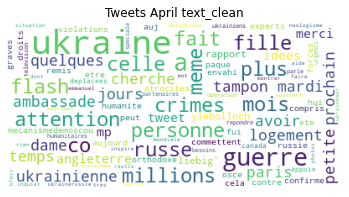

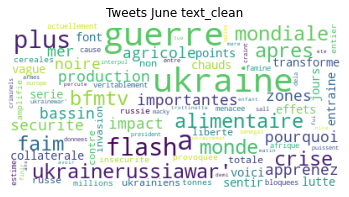

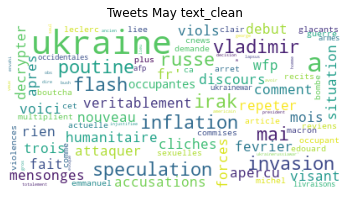

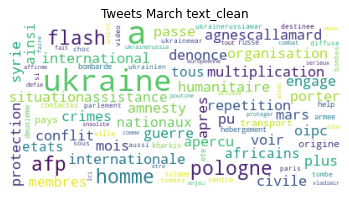

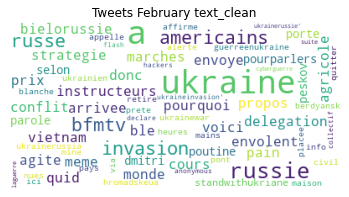

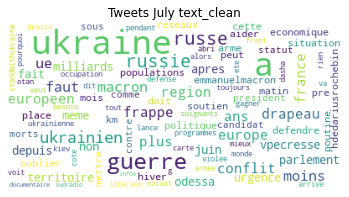

In [38]:
# nuage de mots par mois 
wordcloud_cols('month', 'text_clean', data )

# Nuage de mots - hashtags présents dans les tweets

In [39]:
data['hashtags']

16005                                           [#ukraine]
18745                                           [#ukraine]
19041                                           [#ukraine]
17592                                           [#ukraine]
16003                                       [#m, #ukraine]
                               ...                        
267                  [#russie, #ukraine, #ukraineinvasion]
15907                                  [#ukraine, #macron]
16037                                     [#oms, #ukraine]
3124     [#anonymous, #russie, #ukraine, #laguerre, #uk...
11934                                 [#poutine, #ukraine]
Name: hashtags, Length: 19834, dtype: object

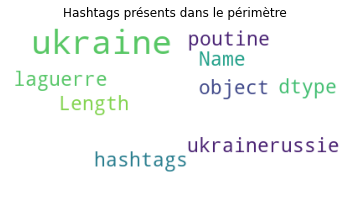

In [40]:
wordcloud_hash = WordCloud(background_color='white',
                          stopwords=stopwords_set,
                          max_words=100,
                          max_font_size=40,
                          random_state=42
                         ).generate(str(data['hashtags'].explode()))

plt.title('Hashtags présents dans le périmètre')
plt.axis('off')
plt.imshow(wordcloud_hash)
plt.savefig("wordcloud_hashtags.png")

### <span style="color:#191970">2.3. Monitorer l'évolution du #Ukraine </span>

In [41]:
# on utilise "text" au lieu de "text_clean" pour trouver les #
data["Occurrence #Ukraine"] = data["text"].apply(
        lambda y: len([x.group() for x in re.finditer(r"#ukraine+", y)])
    )

In [42]:
temp = data.groupby("date")["Occurrence #Ukraine"].sum().reset_index()
temp

,date,Occurrence #Ukraine
0,2022-02-01,12
1,2022-02-02,13
2,2022-02-03,13
3,2022-02-04,22
4,2022-02-05,7
...,...,...
146,2022-06-27,77
147,2022-06-28,60
148,2022-06-29,42
149,2022-06-30,43


In [43]:
fig = px.line(temp,
              x='date',
              y="Occurrence #Ukraine",
              markers="True",
              title="Ocurrence #Ukraine",
              labels={
                     "Occurrence #Ukraine": "Ocurrence"
                 }
             ) 
fig.show()

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



## Ocurrence des mots clées telles que Marioupol, Crimée, Kiev...

In [44]:
table = data.copy(deep=True)

val = ['marioupol', 'crimee', 'kiev', 'louhansk', 'kramatorsk', 'lviv', 'kherson']

for elem in val:
    table[elem] = table["text_clean"].apply(
        lambda y: len([x.group() for x in re.finditer(f"{elem}+", y)])
    )

table[val].sum()

marioupol      466
crimee         106
kiev          1228
louhansk        22
kramatorsk      72
lviv           142
kherson        114
dtype: int64

In [45]:
tab2 = table.groupby("date")[val + ['Occurrence #Ukraine']].sum().reset_index()
tab2

,date,marioupol,crimee,kiev,louhansk,kramatorsk,lviv,kherson,Occurrence #Ukraine
0,2022-02-01,0,0,2,0,0,0,0,12
1,2022-02-02,0,0,0,0,0,0,0,13
2,2022-02-03,0,1,1,0,0,0,0,13
3,2022-02-04,0,0,2,0,0,0,0,22
4,2022-02-05,0,0,0,0,0,0,0,7
...,...,...,...,...,...,...,...,...,...
146,2022-06-27,0,0,3,0,1,0,0,77
147,2022-06-28,1,0,3,0,0,0,0,60
148,2022-06-29,0,0,2,0,1,0,1,42
149,2022-06-30,0,0,2,0,0,0,0,43


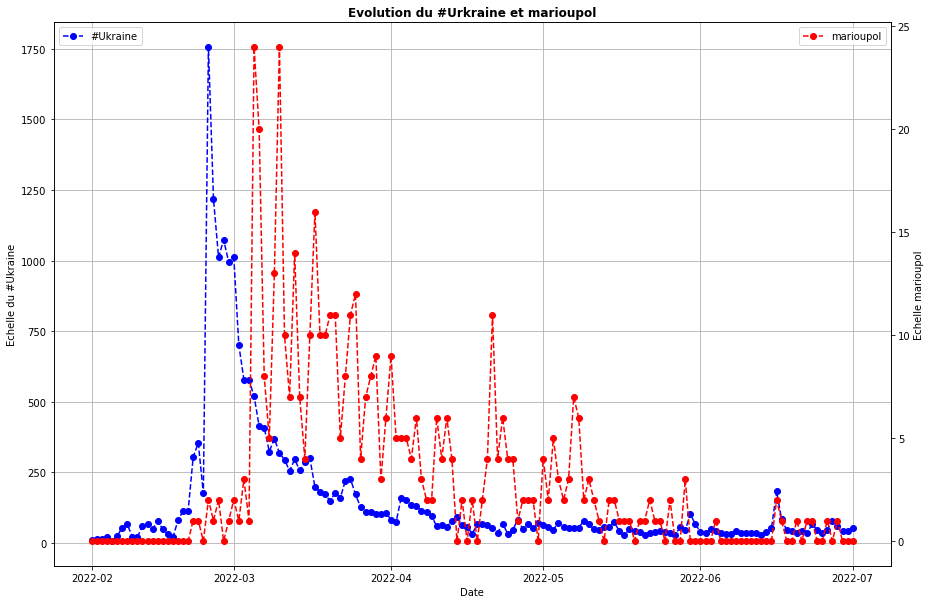

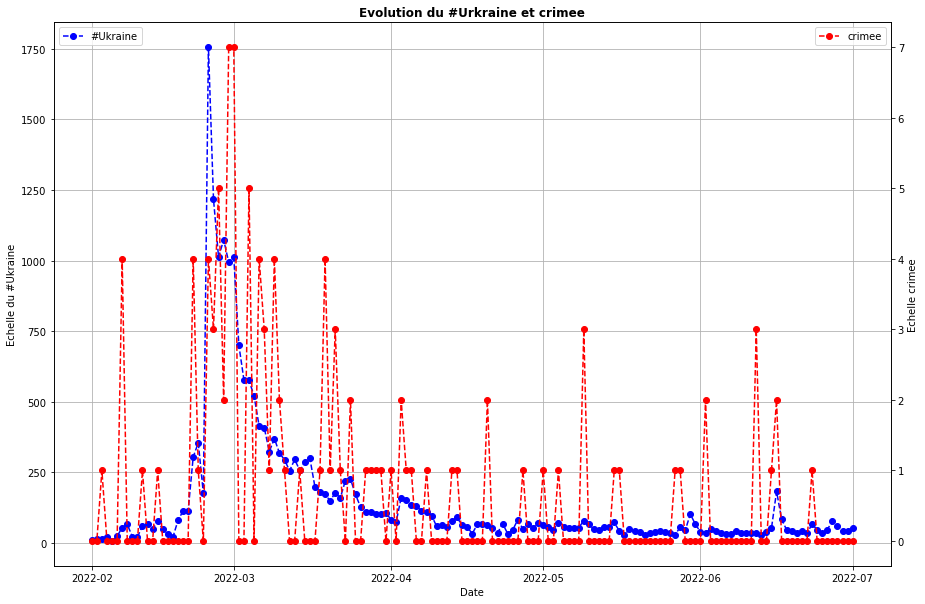

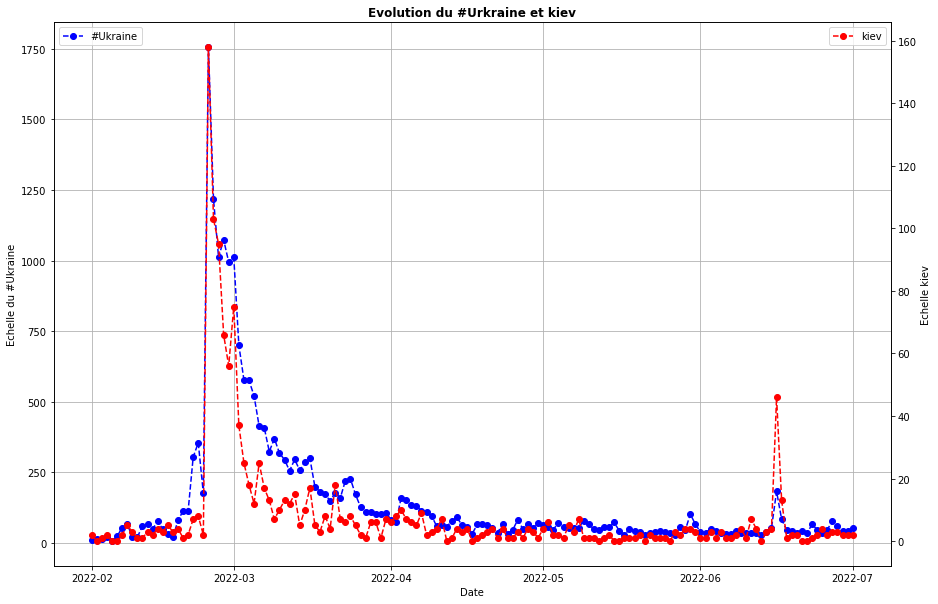

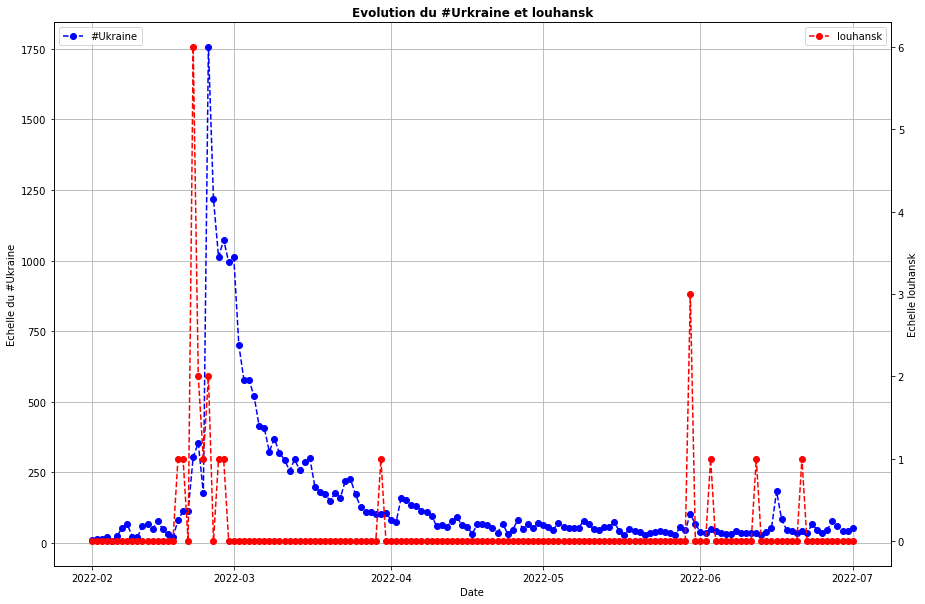

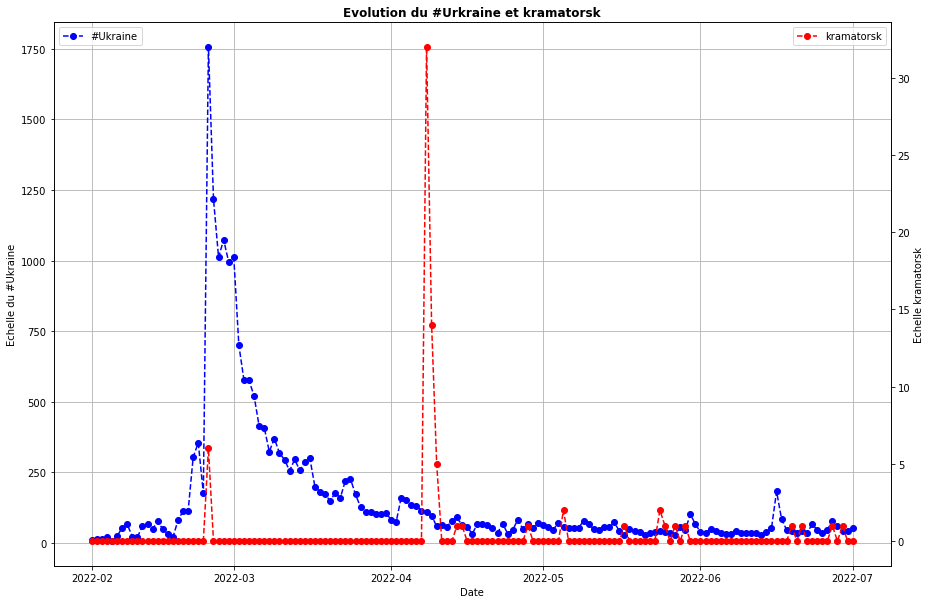

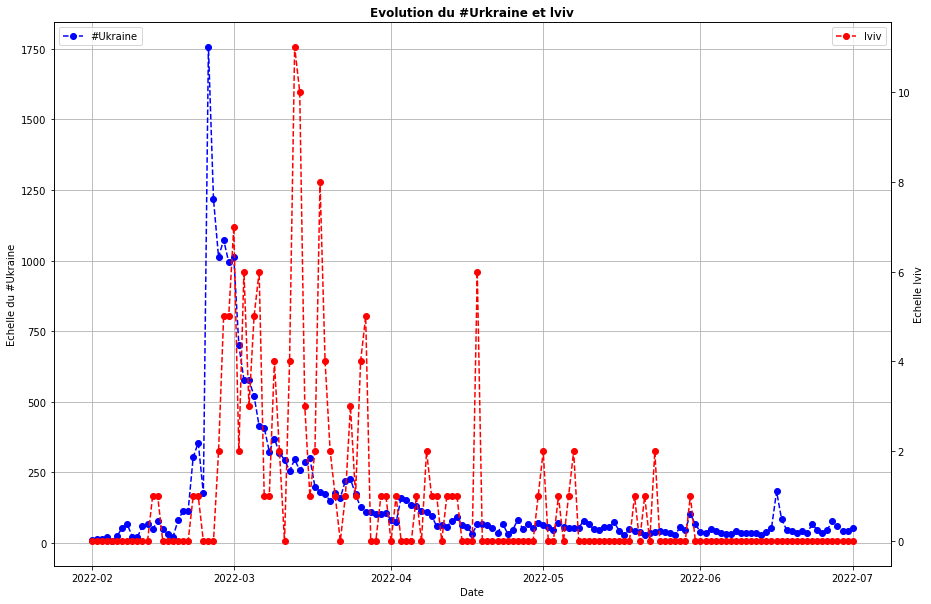

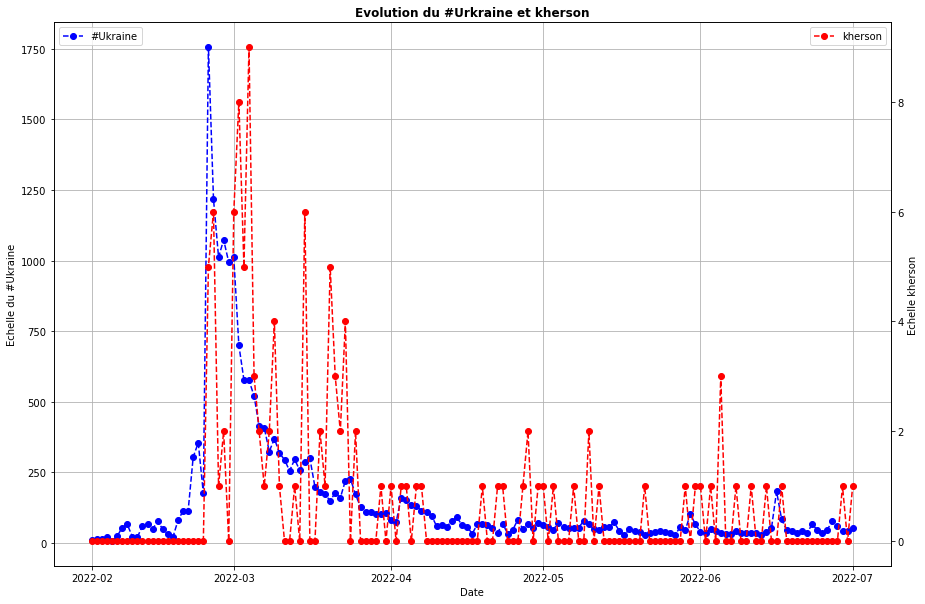

In [46]:
for elem in val:
    fig = plt.figure(figsize=(15,10))
    ax = fig.add_subplot(111)
    ax.plot(tab2['date'], tab2['Occurrence #Ukraine'], color = 'blue', linestyle='dashed', marker = 'o', label='#Ukraine')
    ax2 = ax.twinx()
    ax2.plot(tab2['date'], tab2[elem], color = 'red', linestyle='dashed', marker = 'o', label=elem)
    plt.title('Evolution du #Urkraine et '+elem, fontweight="bold")
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')
    ax.grid()
    ax.set_xlabel("Date")
    ax.set_ylabel(r"Echelle du #Ukraine")
    ax2.set_ylabel(r"Echelle "+elem)
    plt.show()

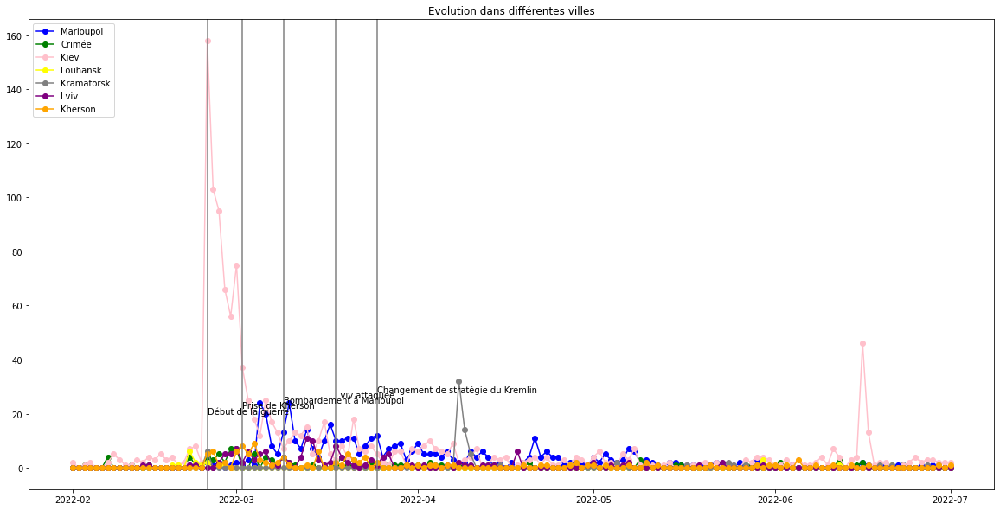

In [47]:
import datetime as dt
plt.figure(figsize=(20,10))

plt.plot(tab2['date'], tab2['marioupol'], color = 'blue', marker='o', label = 'Marioupol');
plt.plot(tab2['date'], tab2['crimee'], color = 'green', marker='o', label = 'Crimée');
plt.plot(tab2['date'], tab2['kiev'], color = 'pink', marker='o', label = 'Kiev');
plt.plot(tab2['date'], tab2['louhansk'], color = 'yellow', marker='o', label = 'Louhansk');
plt.plot(tab2['date'], tab2['kramatorsk'], color = 'gray', marker='o', label = 'Kramatorsk');
plt.plot(tab2['date'], tab2['lviv'], color = 'purple', marker='o', label = 'Lviv');
plt.plot(tab2['date'], tab2['kherson'], color = 'orange', marker='o', label = 'Kherson');

plt.title('Evolution dans différentes villes')
plt.axvline(dt.datetime(2022, 2, 24), color = 'gray')
plt.text(dt.datetime(2022, 2, 24), 20, 'Début de la guerre')

plt.axvline(dt.datetime(2022, 3, 2), color = 'gray')
plt.text(dt.datetime(2022, 3, 2), 22, 'Prise de Kherson')

plt.axvline(dt.datetime(2022, 3, 9), color = 'gray')
plt.text(dt.datetime(2022, 3, 9), 24, 'Bombardement à Marioupol')

plt.axvline(dt.datetime(2022, 3, 18), color = 'gray')
plt.text(dt.datetime(2022, 3, 18), 26, 'Lviv attaquée')

plt.axvline(dt.datetime(2022, 3, 25), color = 'gray')
plt.text(dt.datetime(2022, 3, 25), 28, 'Changement de stratégie du Kremlin')

plt.legend(loc = 'upper left')
plt.show()

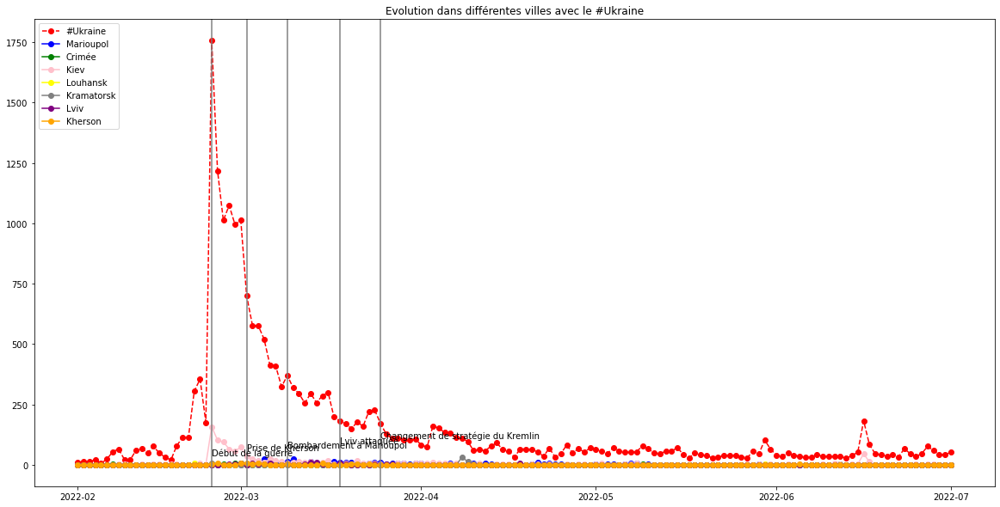

In [48]:
plt.figure(figsize=(20,10))

plt.plot(tab2['date'], tab2['Occurrence #Ukraine'], color = 'red', linestyle='dashed', marker='o', label = '#Ukraine');
plt.plot(tab2['date'], tab2['marioupol'], color = 'blue', marker='o', label = 'Marioupol');
plt.plot(tab2['date'], tab2['crimee'], color = 'green', marker='o', label = 'Crimée');
plt.plot(tab2['date'], tab2['kiev'], color = 'pink', marker='o', label = 'Kiev');
plt.plot(tab2['date'], tab2['louhansk'], color = 'yellow', marker='o', label = 'Louhansk');
plt.plot(tab2['date'], tab2['kramatorsk'], color = 'gray', marker='o', label = 'Kramatorsk');
plt.plot(tab2['date'], tab2['lviv'], color = 'purple', marker='o', label = 'Lviv');
plt.plot(tab2['date'], tab2['kherson'], color = 'orange', marker='o', label = 'Kherson');

plt.title('Evolution dans différentes villes avec le #Ukraine')

plt.axvline(dt.datetime(2022, 2, 24), color = 'gray')
plt.text(dt.datetime(2022, 2, 24), 40, 'Début de la guerre')

plt.axvline(dt.datetime(2022, 3, 2), color = 'gray')
plt.text(dt.datetime(2022, 3, 2), 60, 'Prise de Kherson')

plt.axvline(dt.datetime(2022, 3, 9), color = 'gray')
plt.text(dt.datetime(2022, 3, 9), 70, 'Bombardement à Marioupol')

plt.axvline(dt.datetime(2022, 3, 18), color = 'gray')
plt.text(dt.datetime(2022, 3, 18), 90, 'Lviv attaquée')

plt.axvline(dt.datetime(2022, 3, 25), color = 'gray')
plt.text(dt.datetime(2022, 3, 25), 110, 'Changement de stratégie du Kremlin')

plt.legend(loc = 'upper left')
plt.show()

### <span style="color:#191970">Autres hashtags présents dans les tweets</span>

In [49]:
# Hastags
data['hashtags_pertw'] = data["hashtags"].apply(lambda x: len(x))
hashtags_list = data.hashtags.explode()
hashtags_list.value_counts()

#ukraine      20076
#russie        3430
#poutine       2011
#macron        1069
#zelensky       658
              ...  
#roquettes        1
#label            1
#victoire         1
#fondapol         1
#langues          1
Name: hashtags, Length: 4565, dtype: int64

In [50]:
hts = hashtags_list.value_counts().reset_index().iloc[:20]
hts

fig_autres_htg = px.bar(hts,
              x='hashtags',
              y='index',
              orientation='h',
              title='Top 20 des hashtags',
              labels={
                     "index": "",
                     "hashtags": ""
                 }
             )
fig_autres_htg.show()

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



### <span style="color:#191970">2.4. Statistiques des comptes officiels du Gouvernement</span>

#### <span style="color:#191970">Evolution nb de tweets</span>

In [51]:
comptes_gouv = ["Interieur_Gouv", "PoliceNationale", "Gendarmerie", "SecCivileFrance", "Prefpolice", "PorteParoleMI", "gouvernementFR"]

In [52]:
df_gouv = data[data['username'].isin(comptes_gouv)]

Peu de tweets présents dans le périmètre (34)

In [53]:
df_gouv.shape

(34, 21)

In [54]:
df_gouv.reset_index(inplace=True, drop=True)

In [55]:
df_gouv.tail()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count,hashtags,arrobas,...,language,date,day,month,time,hour,minute,tranches_like,Occurrence #Ukraine,hashtags_pertw
29,2022-03-22 11:38:25+00:00,1506233836132261893,solidarité avec l’#ukraine 🇺🇦🤝🇫🇷\r\ndépart dem...,SecCivileFrance,448,144,14,16,[#ukraine],[],...,fr,2022-03-22,22,3,11:38:25,11,38,[201-1000 likes],1,1
30,2022-03-23 17:06:43+00:00,1506678841103863808,#solidarité #ukraine 🇺🇦🤝🇫🇷 le convoi à destina...,SecCivileFrance,494,119,7,8,"[#solidarit, #ukraine]",[],...,fr,2022-03-23,23,3,17:06:43,17,6,[201-1000 likes],1,2
31,2022-03-27 11:17:46+00:00,1508040576628928519,#solidarité 🇺🇦🤝🇫🇷 départ ce matin pour l’#ukra...,SecCivileFrance,504,108,7,8,"[#solidarit, #ukraine]",[@cdcmae],...,fr,2022-03-27,27,3,11:17:46,11,17,[201-1000 likes],1,2
32,2022-03-08 17:31:04+00:00,1501249151761268739,[#ukraine] pensées fraternelles et solidaires ...,PoliceNationale,609,90,68,4,[#ukraine],[],...,fr,2022-03-08,8,3,17:31:04,17,31,[201-1000 likes],1,1
33,2022-03-26 20:08:31+00:00,1507811758202929154,#solidarité #ukraine🇺🇦🤝🇫🇷 après 2 200 kilomètr...,SecCivileFrance,1241,333,29,26,"[#solidarit, #ukraine, #roumanie]",[],...,fr,2022-03-26,26,3,20:08:31,20,8,>1000 likes,1,3


In [56]:
df_gouv.tail()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count,hashtags,arrobas,...,language,date,day,month,time,hour,minute,tranches_like,Occurrence #Ukraine,hashtags_pertw
29,2022-03-22 11:38:25+00:00,1506233836132261893,solidarité avec l’#ukraine 🇺🇦🤝🇫🇷\r\ndépart dem...,SecCivileFrance,448,144,14,16,[#ukraine],[],...,fr,2022-03-22,22,3,11:38:25,11,38,[201-1000 likes],1,1
30,2022-03-23 17:06:43+00:00,1506678841103863808,#solidarité #ukraine 🇺🇦🤝🇫🇷 le convoi à destina...,SecCivileFrance,494,119,7,8,"[#solidarit, #ukraine]",[],...,fr,2022-03-23,23,3,17:06:43,17,6,[201-1000 likes],1,2
31,2022-03-27 11:17:46+00:00,1508040576628928519,#solidarité 🇺🇦🤝🇫🇷 départ ce matin pour l’#ukra...,SecCivileFrance,504,108,7,8,"[#solidarit, #ukraine]",[@cdcmae],...,fr,2022-03-27,27,3,11:17:46,11,17,[201-1000 likes],1,2
32,2022-03-08 17:31:04+00:00,1501249151761268739,[#ukraine] pensées fraternelles et solidaires ...,PoliceNationale,609,90,68,4,[#ukraine],[],...,fr,2022-03-08,8,3,17:31:04,17,31,[201-1000 likes],1,1
33,2022-03-26 20:08:31+00:00,1507811758202929154,#solidarité #ukraine🇺🇦🤝🇫🇷 après 2 200 kilomètr...,SecCivileFrance,1241,333,29,26,"[#solidarit, #ukraine, #roumanie]",[],...,fr,2022-03-26,26,3,20:08:31,20,8,>1000 likes,1,3


In [57]:
#evolution nb de tweets par jour du Gouvernement (qui ont été retweetés au moins 10 fois)

#tpd=nb tweets per day
tpd_gouv = df_gouv.groupby("date")["tweet_id"].count().reset_index()
tpd_gouv.sort_values(by="tweet_id", ascending=False)

,date,tweet_id
2,2022-02-27,2
3,2022-03-01,2
7,2022-03-08,2
12,2022-03-22,2
18,2022-04-14,2
14,2022-03-24,2
17,2022-03-30,2
0,2022-02-24,1
16,2022-03-27,1
25,2022-06-20,1


In [58]:
#evolution du nb de tweets par jour du Gouvernement
fig = px.line(tpd_gouv,
              x="date",
              y="tweet_id",
              title='Evolution du nb de tweets par jour du Gouvernement',
              labels={
                     "tweet_id": "Nb de tweets"
                 }
             )
fig.show()

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



Peu de tweets officiels (retweetés au moins 10 fois) par jour : entre 1 et 2 par jour.

27/02 : Russie menace nucléaire / UE envoie des armes à l'Ukraine <br>
01/03 : Convoi militaire de la Russie vers Kiev <br>
08/03 : Chine encourage cessez le feu / sanctions augmentent<br>
22/03 : Les Etats-Unis et l'Europe vont infliger de nouvelles sanctions à la Russie <br>
24/03 : changement de stratégie du Kremlin<br>
30/03 : "régime de silence", soit un cessez-le-feu local, dans le port assiégé de Marioupol. Cette mesure doit permettre d'ouvrir un couloir humanitaire<br>
14/04 : le « Moskva » coule<br>


#### <span style="color:#191970">Stats describe - variables num</span>

In [59]:
df_gouv[count_var].describe()

,like_count,retweet_count,reply_count,quote_count
count,34.000000,34.000000,34.000000,34.000000
mean,217.500000,63.764706,35.764706,4.882353
std,233.622364,58.182606,66.920151,5.197696
min,32.000000,14.000000,0.000000,0.000000
25%,71.000000,30.000000,4.250000,2.000000
50%,143.000000,50.000000,8.000000,3.500000
75%,258.750000,76.000000,24.500000,6.000000
max,1241.000000,333.000000,311.000000,26.000000


En moyenne un tweet du Gouvernement est liké 217 fois et peut aller jusqu'à un maximum de 1241 likes. <br>
Par ailleurs, un tweet est retweeté 64 fois en moyenne et peut être retweeté au maximum jusqu'à 333 fois.<br>

#### <span style="color:#191970">Distributions - variables num</span>

Text(0.5, 0.98, 'Statistiques de base des tweets du Gouvernement')

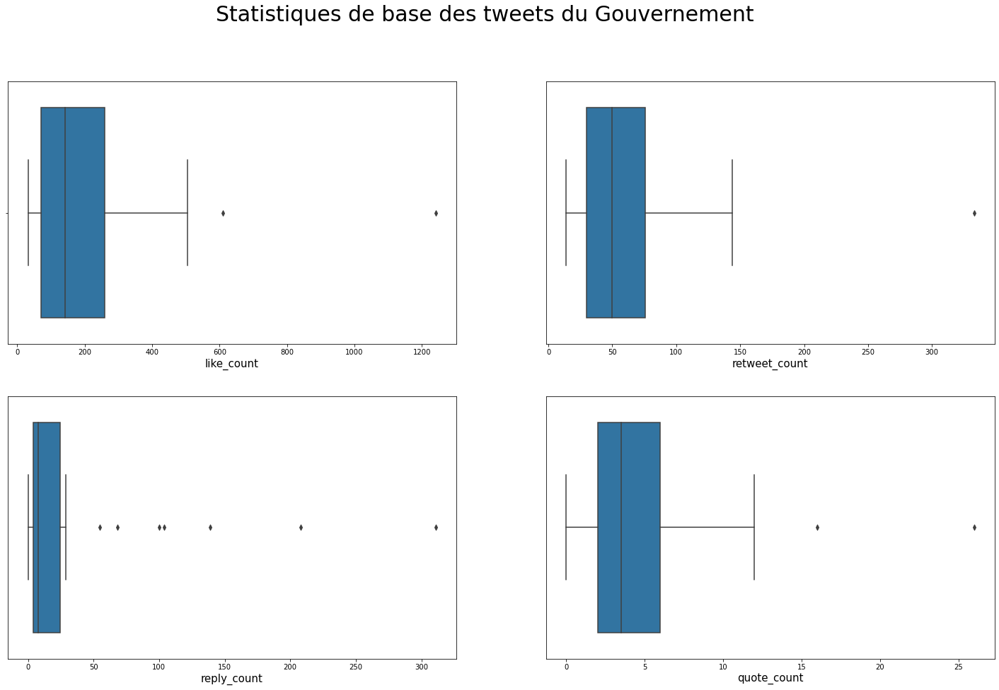

In [60]:
#Boxplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 15))

ax1 = sns.boxplot(x="like_count", data=df_gouv, ax=axes[0,0])
ax2 = sns.boxplot(x="retweet_count", data=df_gouv, ax=axes[0,1])
ax3 = sns.boxplot(x="reply_count", data=df_gouv, ax=axes[1,0])
ax4 = sns.boxplot(x="quote_count", data=df_gouv, ax=axes[1,1])

ax1.set_ylabel('', fontsize=15)
ax1.set_xlabel('like_count', fontsize=15)

ax2.set_ylabel('', fontsize=15)
ax2.yaxis.set_visible(False)
ax2.set_xlabel('retweet_count', fontsize=15)

ax3.set_ylabel('', fontsize=15)
ax3.yaxis.set_visible(False)
ax3.set_xlabel('reply_count', fontsize=15)

ax4.set_ylabel('', fontsize=15)
ax4.yaxis.set_visible(False)
ax4.set_xlabel('quote_count', fontsize=15)
fig.suptitle('Statistiques de base des tweets du Gouvernement', fontsize=30)

In [61]:
df_gouv[df_gouv['like_count']>600].head()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count,hashtags,arrobas,...,language,date,day,month,time,hour,minute,tranches_like,Occurrence #Ukraine,hashtags_pertw
32,2022-03-08 17:31:04+00:00,1501249151761268739,[#ukraine] pensées fraternelles et solidaires ...,PoliceNationale,609,90,68,4,[#ukraine],[],...,fr,2022-03-08,8,3,17:31:04,17,31,[201-1000 likes],1,1
33,2022-03-26 20:08:31+00:00,1507811758202929154,#solidarité #ukraine🇺🇦🤝🇫🇷 après 2 200 kilomètr...,SecCivileFrance,1241,333,29,26,"[#solidarit, #ukraine, #roumanie]",[],...,fr,2022-03-26,26,3,20:08:31,20,8,>1000 likes,1,3


In [62]:
df_gouv[df_gouv['retweet_count']>300].head()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count,hashtags,arrobas,...,language,date,day,month,time,hour,minute,tranches_like,Occurrence #Ukraine,hashtags_pertw
33,2022-03-26 20:08:31+00:00,1507811758202929154,#solidarité #ukraine🇺🇦🤝🇫🇷 après 2 200 kilomètr...,SecCivileFrance,1241,333,29,26,"[#solidarit, #ukraine, #roumanie]",[],...,fr,2022-03-26,26,3,20:08:31,20,8,>1000 likes,1,3


Les tweets les plus populaires en termes de like et retweet sont ceux qui parlent de solidarité

#### <span style="color:#191970">Répartition des tweets/tranches de like</span>

In [63]:
tranches_like_gouv = [
    (df_gouv['like_count'] > 500) ,
    (df_gouv['like_count'] > 200) & (df_gouv['like_count'] <=500),
    (df_gouv['like_count'] > 100) & (df_gouv['like_count'] <=200),
    (df_gouv['like_count'] > 0) & (df_gouv['like_count'] <=100),
    (df_gouv['like_count'] == 0)]
choicelist_gouv = [">500 likes", "[201-500 likes]", "[101-200 likes]", "[1-100 likes]", "0 like"]
df_gouv['tranches_like'] = np.select(tranches_like_gouv, choicelist_gouv, default='Not Specified')
df_gouv = df_gouv.sort_values(by=["like_count"], ascending=True)

C:\Users\vnarv\AppData\Local\Temp\ipykernel_16080\4247361917.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [64]:
tmp = df_gouv["tranches_like"].value_counts().sort_values(ascending=False).reset_index()
tmp

,index,tranches_like
0,[1-100 likes],13
1,[201-500 likes],10
2,[101-200 likes],8
3,>500 likes,3


In [65]:
#Histogramme de répartition des tweets du Gouvernement par tranche de like
fig = px.bar(tmp,
             x="tranches_like",
             y="index",
            title="Répartition des tweets du Gouvernement par tranche de like",
            labels={
                     "index": "",
                     "tranches_like": "Nb de tweets"
                 })
fig.show()

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



#### <span style="color:#191970">Nuages de mots</span>

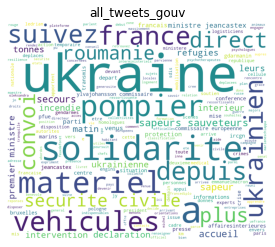

In [66]:
stopwords_set = set(stopwords.words('french')) #nltk
    
wordcloud_gouv = WordCloud(background_color='white',
                           collocations=True, # Inclu les bigrammes -> Deux mots cotes à cotes, même couleur même taille
                           width=1200,
                           height=1000,
                           stopwords=stopwords_set).generate(" ".join(df_gouv['text_clean']))

plt.axis('off')
plt.title('all_tweets_gouv')
plt.imshow(wordcloud_gouv)
plt.savefig("wordcloud_general_gouv.png")

Mots importants : Solidarité, réfugiés, sécurité civile, matériel, Roumanie, pompier, sapeurs sauveteurs, véhicules, convoi, secours, Affaires intérieures

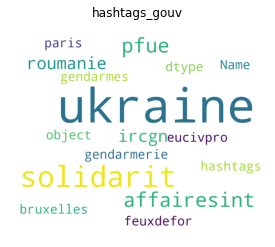

In [67]:
gouv_hash = WordCloud(background_color='white',
                           collocations=True, # Inclu les bigrammes 
                           width=1200,
                           height=1000,
                           stopwords=stopwords_set).generate(str(df_gouv['hashtags'].explode()))

plt.axis('off')
plt.title('hashtags_gouv')
plt.imshow(gouv_hash)
plt.savefig("wordcloud_hashtags_gouv.png")

Mots importants : Solidarité, Roumanie, Affaires intérieures, Gendarmerie, PFUE<br>
C'est vraiment la solidarité qui ressort des tweets du Gouvernement. Entre les tweets les plus populaires qui parlent de solidarité et les nuages de mots qui font ressortir à chaque fois ce terme de Solidarité.

#### <span style="color:#191970">Evolution du nb de Hashtag SOLIDARITE</span>

In [68]:
df_gouv["hash_solidarite"] = df_gouv["text"].apply(
        lambda y: len([x.group() for x in re.finditer(r"#solidar+", y)])
    )

In [69]:
df_gouv.to_csv('./df_gouv.csv', index=False)

In [70]:
df_gouv[["hashtags","text", "hash_solidarite"]].tail(9)

,hashtags,text,hash_solidarite
25,[#ukraine],#ukraine | déclaration du président de la répu...,0
26,[#ukraine],en direct | situation en #ukraine : suivez la ...,0
27,"[#ukraine, #ircgn]","#ukraine • sur le terrain, les gendarmes de l'...",0
28,"[#ukraine, #gendarmes, #ircgn, #gendarmerie]","#ukraine depuis plus de deux mois, des #gendar...",0
29,[#ukraine],solidarité avec l’#ukraine 🇺🇦🤝🇫🇷\r\ndépart dem...,0
30,"[#solidarit, #ukraine]",#solidarité #ukraine 🇺🇦🤝🇫🇷 le convoi à destina...,1
31,"[#solidarit, #ukraine]",#solidarité 🇺🇦🤝🇫🇷 départ ce matin pour l’#ukra...,1
32,[#ukraine],[#ukraine] pensées fraternelles et solidaires ...,0
33,"[#solidarit, #ukraine, #roumanie]",#solidarité #ukraine🇺🇦🤝🇫🇷 après 2 200 kilomètr...,1


In [71]:
#nb de hashtags "solidarité" par jour
hash_solidarite=df_gouv.groupby("date")["hash_solidarite"].sum().reset_index()
display(hash_solidarite)

,date,hash_solidarite
0,2022-02-24,0
1,2022-02-25,0
2,2022-02-27,0
3,2022-03-01,0
4,2022-03-02,0
5,2022-03-03,0
6,2022-03-04,0
7,2022-03-08,0
8,2022-03-10,0
9,2022-03-14,0


In [72]:
#Evolution du nb de hashtag "solidarité" dans les tweets du Gouvernement
fig5 = px.line(hash_solidarite,
               x='date',
               y="hash_solidarite",
              title="Evolution du nb de '#solidarité' dans les tweets du Gouvernement"
              )
fig5.show()

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\vnarv\anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



Les pics conrrespondent avec les départs des 3 convois de Solidarité nationale envers l'Ukraine, acheminant des dons de matériels et véhicules de secours. <br>
23 au 27 mars : 1er convoi<br>
14 au 21 avril : 2nd convoi<br>
10 mai : 3ème convoi

## <span style="color:#191970">3. Pré processing</span>

Import des données après le preprocessing qui comprend les étapes suivantes : 
- Refiltre sur tweets restants en anglais
- supprime les tweets repetés (même username et contenu du tweet, peu importe la date)
- supprime les liens html
- supprime des stopwords dans le dictionnaire nlk et ceux que nous avons ajouté
- applique les méthodes de lemmatisation et stemming 
- creé des bigrames et des trigrams

In [88]:
raw_data = read_files(os.path.join(path, "data/min_retweet_10/"))
print(raw_data.shape)
# drop repeated tweets no matter the date
raw_data = raw_data.drop_duplicates(["text", "username"])
print(f"Shape after dropping duplicates {raw_data.shape}")

# format dates
data = transform_dates(raw_data)
# clean tweets
df_prepro = preprocessing(data)

C:\Users\vnarv\PycharmProjects\twitter_text_mining
(19939, 8)
Shape after dropping duplicates (19933, 8)
Nb of tweets detected in other language language
af     6
ca     9
cs     2
da     6
de    13
en    68
es     5
et     7
fi    14
hr     3
id     3
it    19
lt     5
lv     1
nl     4
no    15
pl     1
ro     4
sk     1
sl     4
sv     2
Name: tweet_id, dtype: int64
                                             text_clean language
93          desescaladez vladimir par cocoboer ukraine        es
192   spanish minister of foreign affairs jose manue...       en
386    g finance ministers statement on ukraine g g ger       nl
430         convoidelaliberte ukraine atomium lesoirbe        it
677   soyons bref quoi que macron decide je m y oppo...       es
703    editionspeciale ukraine a h edition speciale ...       en
1148  ukraine foreign ministry recalls charge d affa...       en
1502          explosions in kyiv via neilphauer ukraine       fi
1540                          chaos in khar

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\vnarv\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Shape before dropping dups: (19741, 18)
Shape after dropping dups: (19534, 18)


In [89]:
df_prepro.shape

(19534, 24)

In [90]:
raw_data.shape

(19933, 17)

In [91]:
df_prepro.head()

,datetime,tweet_id,text,username,like_count,retweet_count,reply_count,quote_count,date,day,...,hashtags,arrobas,text_clean,language,text_stem,text_stem_bigram,text_stem_trigram,text_lemma,text_lemma_bigram,text_lemma_trigram
0,2022-02-01 08:44:30+00:00,1488433061196812291,"voilà l'info, malheureusement très peu reprise...",tcabarrus,58,33,2,0,2022-02-01,1,...,"[#medias, #emmanuelmacron, #vladimirpoutine, #...",[],malheureusement tres peu reprise medias entret...,fr,malheur tre peu repris medi entretien telephon...,malheur_tre tre_peu peu_repris repris_medi med...,malheur_tre_peu tre_peu_repris peu_repris_medi...,malheureusement tres peu reprise media entreti...,malheureusement_tres tres_peu peu_reprise repr...,malheureusement_tres_peu tres_peu_reprise peu_...
1,2022-02-01 09:42:34+00:00,1488447673883676672,#ukraine face à poutine ... macron hausse le t...,lapin47,230,103,36,24,2022-02-01,1,...,[#ukraine],[],face poutine macron hausse,fr,fac poutin macron hauss,fac_poutin poutin_macron macron_hauss,fac_poutin_macron poutin_macron_hauss,face poutine macron hausse,face_poutine poutine_macron macron_hausse,face_poutine_macron poutine_macron_hausse
2,2022-02-01 12:43:38+00:00,1488493240475078658,crise en #ukraine : « emmanuel #macron et vlad...,FaireEnsembleEM,63,17,6,0,2022-02-01,1,...,"[#ukraine, #macron, #poutine]",[@gabrielattal],crise macron poutine reparles hier dialogue ec...,fr,cris macron poutin reparl hi dialogu echang no...,cris_macron macron_poutin poutin_reparl reparl...,cris_macron_poutin macron_poutin_reparl poutin...,crise macron poutine reparles hier dialogue ec...,crise_macron macron_poutine poutine_reparles r...,crise_macron_poutine macron_poutine_reparles p...
3,2022-02-01 13:20:13+00:00,1488502446771081216,la #russie c'est l'équivalent du pib de l'ital...,BrunoRetailleau,59,29,9,1,2022-02-01,1,...,"[#russie, #kiev, #ukraine]",[],equivalent pib italie attention sanctions pour...,fr,equivalent pib ital attent sanction pourr rece...,equivalent_pib pib_ital ital_attent attent_san...,equivalent_pib_ital pib_ital_attent ital_atten...,equivalent pib italie attention sanction pourr...,equivalent_pib pib_italie italie_attention att...,equivalent_pib_italie pib_italie_attention ita...
4,2022-02-01 13:56:13+00:00,1488511509961527302,crise en #ukraine : voilà pourquoi il faut sor...,f_philippot,745,236,34,5,2022-02-01,1,...,[#ukraine],[],crise pourquoi sortir piege atlantiste refuser...,fr,cris pourquoi sort pieg atlant refus quitt ota...,cris_pourquoi pourquoi_sort sort_pieg pieg_atl...,cris_pourquoi_sort pourquoi_sort_pieg sort_pie...,crise pourquoi sortir piege atlantiste refuser...,crise_pourquoi pourquoi_sortir sortir_piege pi...,crise_pourquoi_sortir pourquoi_sortir_piege so...


###  Nuage de mots après preprocessing

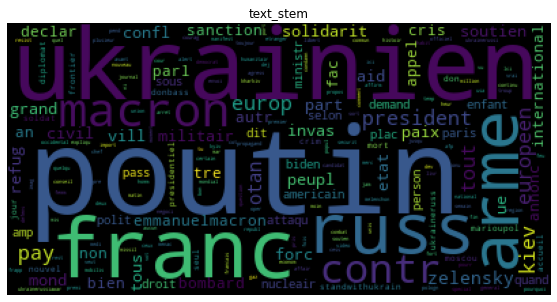

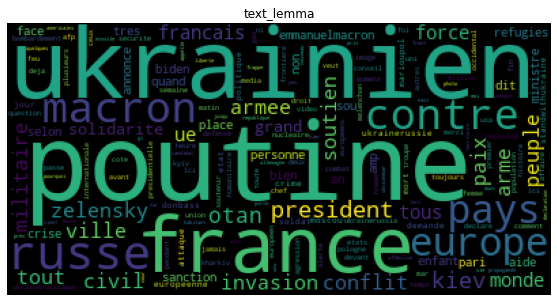

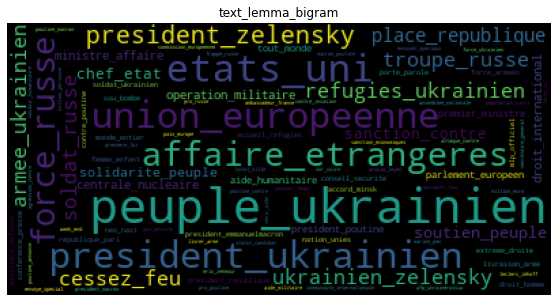

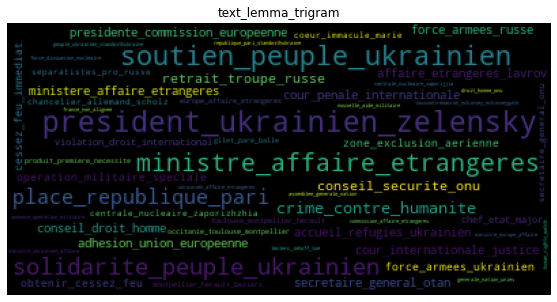

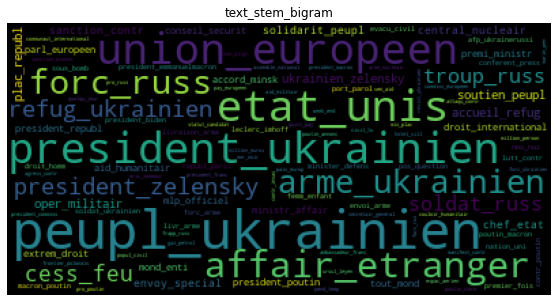

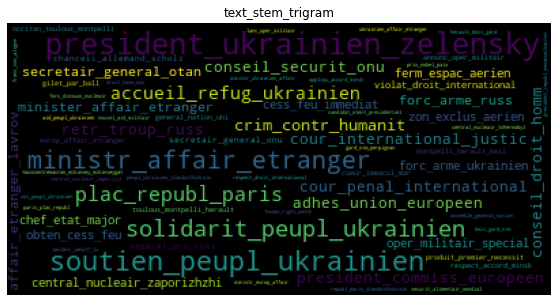

In [92]:
new_cols_prepro = ["text_stem", "text_lemma",
        "text_lemma_bigram", "text_lemma_trigram",
        "text_stem_bigram", "text_stem_trigram"]
for method in new_cols_prepro:
    words_t = ''
    for i in df_prepro[method]:
        try:
            words_t += '{} '.format(i.lower())
        except AttributeError:
            pass
    wd = pd.DataFrame(Counter(words_t.split()).most_common(), columns=['word', 'frequency_total'])
    tuples = [tuple(x) for x in wd.values]
    wordcloud = WordCloud().generate_from_frequencies(dict(tuples))
    plt.subplots(figsize=(10, 5)) 
    plt.imshow(wordcloud)
    plt.title(f"{method}") 
    plt.axis("off")
    plt.show()

### Fréquence des ngrames

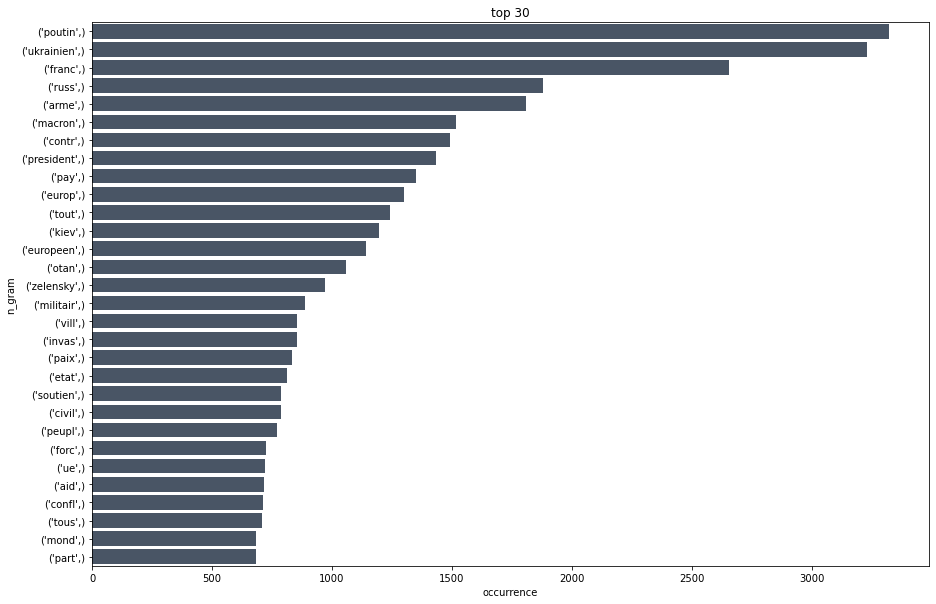

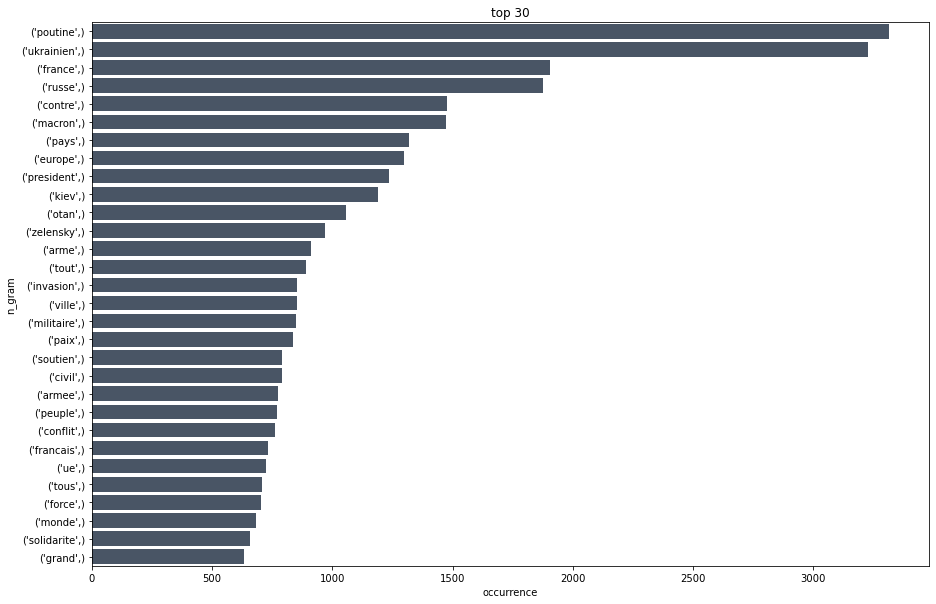

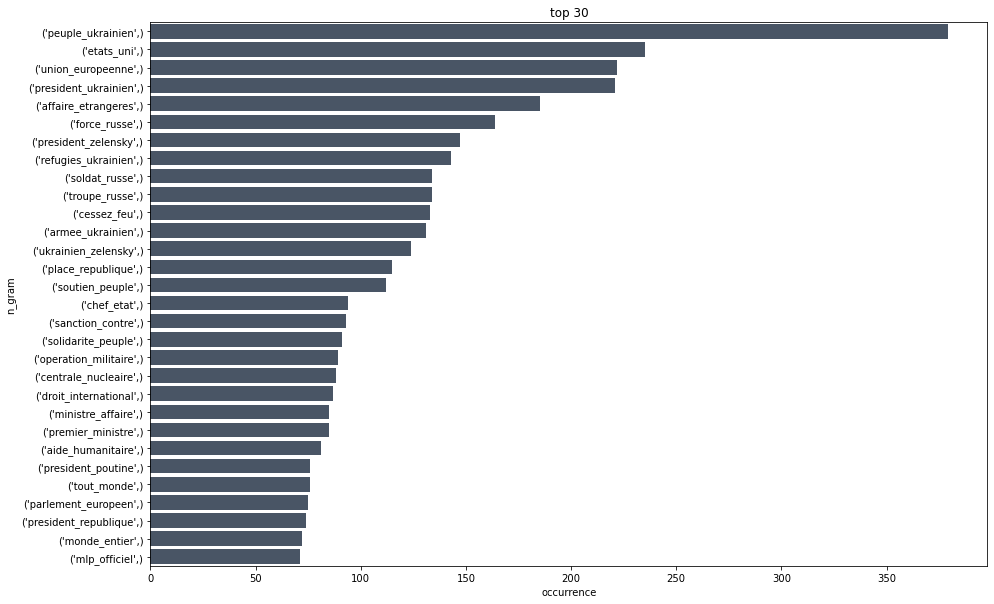

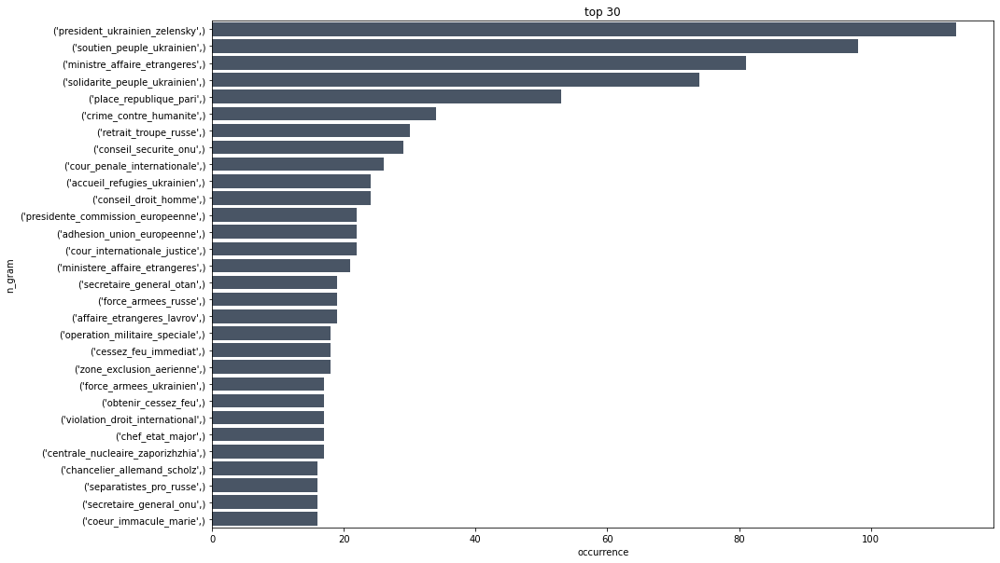

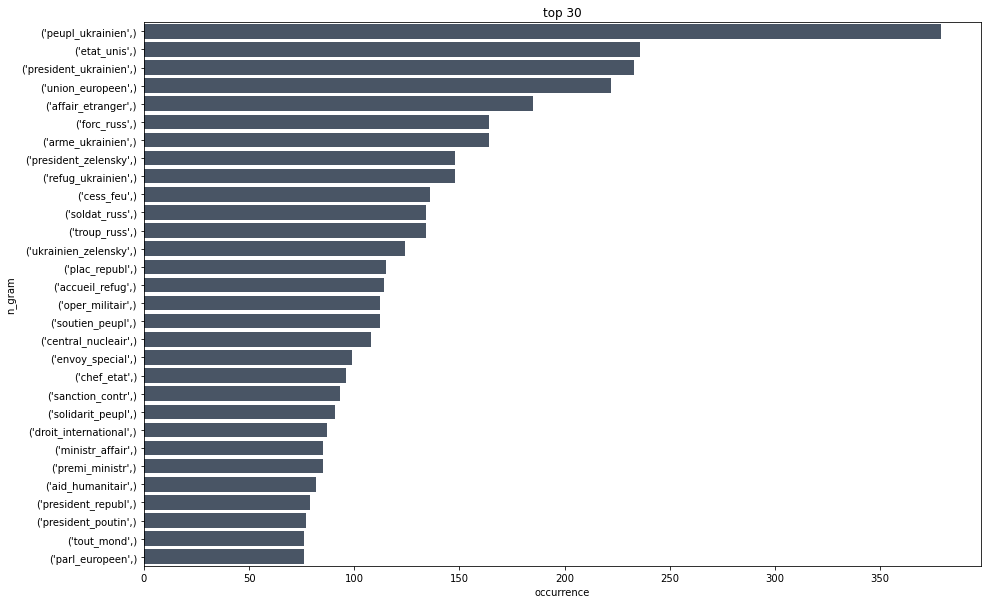

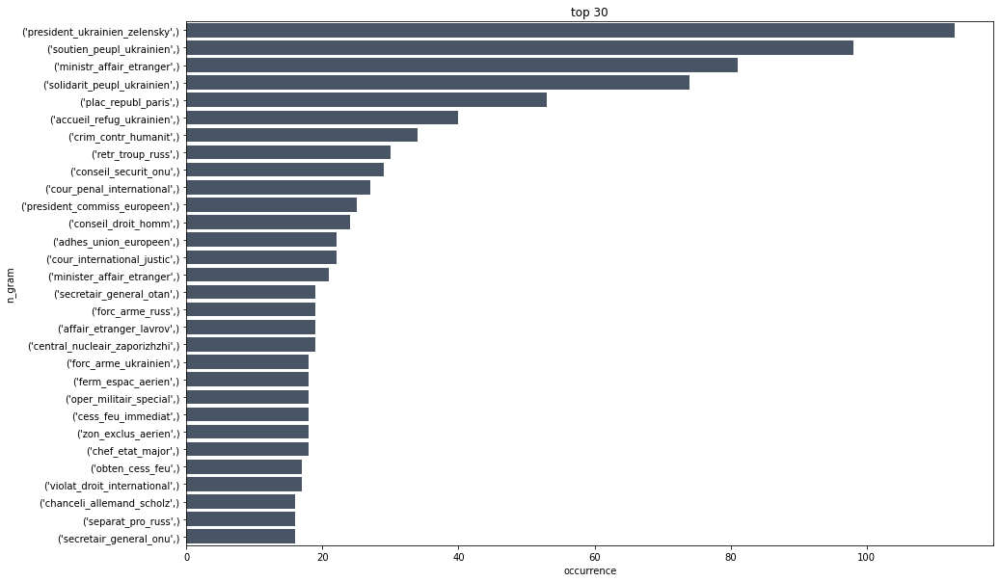

In [93]:
for col in new_cols_prepro:
    tokens = ' '.join(df_prepro[col]).split()
    ngram_top(tokens, n_gram = 1, n_top = 30)

## <span style="color:#191970">4. Vectorisation</span>

### <span style="color:#191970">4.1. CountVectorizer</span>

In [94]:
# Création du vectoriseur 
vectorizer = CountVectorizer(min_df=4) #limiter la taille du vocabulaire avec le paramètre min_df : prend les mots qui sortent au moins 4 fois

# Vectorisation de nos documents
X = vectorizer.fit_transform(df_prepro['text_clean'])
vect_array = X.toarray()
print(vect_array)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [95]:
print(f"Liste des features retenus : \n{vectorizer.get_feature_names_out()}")

Liste des features retenus : 
['abaisser' 'abandon' 'abandonne' ... 'zoom' 'zourabichvili' 'zozz']


In [96]:
##vocabulaire automatiquement constitué par Scikit-Learn (récupéré via vocabulary):
print (f"Taille: {len (vectorizer.vocabulary_)}")

Taille: 9320


In [97]:
df_cv = pd.DataFrame(data=vect_array,columns = vectorizer.get_feature_names_out())
print (df_cv)

       abaisser  abandon  abandonne  abandonnee  abandonner  abandonnes  \
0             0        0          0           0           0           0   
1             0        0          0           0           0           0   
2             0        0          0           0           0           0   
3             0        0          0           0           0           0   
4             0        0          0           0           0           0   
...         ...      ...        ...         ...         ...         ...   
19529         0        0          0           0           0           0   
19530         0        0          0           0           0           0   
19531         0        0          0           0           0           0   
19532         0        0          0           0           0           0   
19533         0        0          0           0           0           0   

       abarluet  abat  abattre  abattu  ...  zemmoureric  zemmourpresident  \
0             0     0

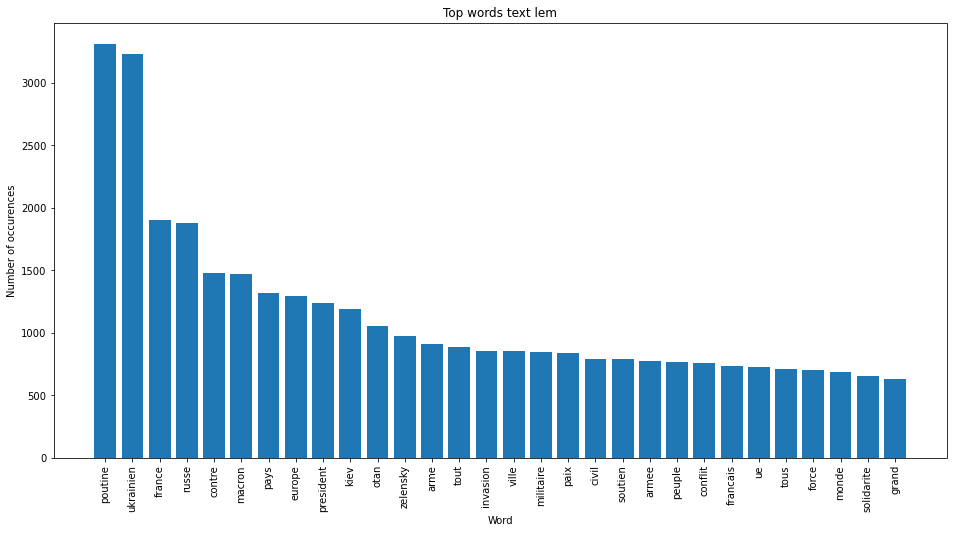

In [98]:
words, word_values = get_top_n_words(n_top_words=30,
                                     count_vectorizer=vectorizer,
                                     text_data=df_prepro["text_lemma"])

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(range(len(words)), word_values);
ax.set_xticks(range(len(words)));
ax.set_xticklabels(words, rotation='vertical');
ax.set_title('Top words text lem');
ax.set_xlabel('Word');
ax.set_ylabel('Number of occurences');
plt.show()

### <span style="color:#191970">4.2. tfidf</span>

In [99]:
print("Ce résultat représente les mots qui ont le meilleur score en utilisant la méthode tf-idf:")
get_tfidf_top_features(df_prepro["text_lemma"], n_top = 30)

Ce résultat représente les mots qui ont le meilleur score en utilisant la méthode tf-idf:


C:\Users\vnarv\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



array(['poutine', 'ukrainien', 'france', 'russe', 'macron', 'contre',
       'europe', 'pays', 'kiev', 'president', 'otan', 'zelensky',
       'invasion', 'arme', 'paix', 'tout', 'militaire', 'soutien',
       'ville', 'armee', 'conflit', 'civil', 'peuple', 'francais', 'ue',
       'solidarite', 'tous', 'monde', 'force', 'grand'], dtype='<U16')

### <span style="color:#191970">4.3. LDA</span>

In [103]:
df_prepro.columns

Index(['datetime', 'tweet_id', 'text', 'username', 'like_count',
       'retweet_count', 'reply_count', 'quote_count', 'date', 'day', 'month',
       'time', 'hour', 'minute', 'hashtags', 'arrobas', 'text_clean',
       'language', 'text_stem', 'text_stem_bigram', 'text_stem_trigram',
       'text_lemma', 'text_lemma_bigram', 'text_lemma_trigram'],
      dtype='object')

===== Method : lemma =====
... Running bag of words
... Running search for best nb of topics
=== LDA model with 2 topics took : 0.97 minutes
Topic: 0 -> Words: 0.031*"ukrainien" + 0.016*"russe" + 0.013*"kiev" + 0.010*"armee" + 0.009*"civil" + 0.008*"crime" + 0.008*"mort" + 0.007*"soutien" + 0.007*"force" + 0.007*"donbass"
Topic: 1 -> Words: 0.014*"poutine" + 0.014*"macron" + 0.012*"france" + 0.010*"europe" + 0.010*"ue" + 0.009*"zelensky" + 0.008*"contre" + 0.007*"arme" + 0.007*"otan" + 0.007*"president"
=== Coherence Score: 0.27
=== LDA model with 3 topics took : 0.86 minutes
Topic: 0 -> Words: 0.038*"ukrainien" + 0.020*"russe" + 0.015*"kiev" + 0.012*"soutien" + 0.011*"civil" + 0.010*"crime" + 0.009*"mort" + 0.009*"amp" + 0.008*"force" + 0.008*"donbass"
Topic: 1 -> Words: 0.024*"france" + 0.017*"europe" + 0.016*"contre" + 0.015*"ue" + 0.013*"pays" + 0.012*"arme" + 0.012*"otan" + 0.010*"francais" + 0.009*"emmanuelmacron" + 0.008*"conflit"
Topic: 2 -> Words: 0.029*"poutine" + 0.028*"macr

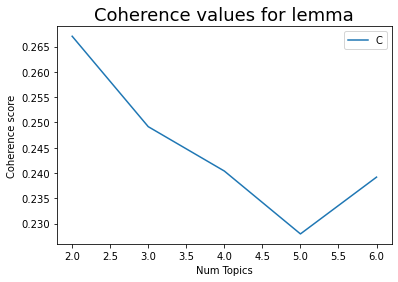

... Running lda with 2 topics
=== LDA model with 2 topics took : 0.98 minutes
Topic: 0 -> Words: 0.031*"ukrainien" + 0.016*"russe" + 0.013*"kiev" + 0.010*"armee" + 0.009*"civil" + 0.008*"crime" + 0.008*"mort" + 0.007*"soutien" + 0.007*"force" + 0.007*"donbass"
Topic: 1 -> Words: 0.014*"poutine" + 0.014*"macron" + 0.012*"france" + 0.010*"europe" + 0.010*"ue" + 0.009*"zelensky" + 0.008*"contre" + 0.007*"arme" + 0.007*"otan" + 0.007*"president"
=== Coherence Score: 0.27
... Running lda visualization
... Running lda visualization


C:\Users\vnarv\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



... Running dominant topics


C:\Users\vnarv\PycharmProjects\twitter_text_mining\src\model\tools_modelling.py:121: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\vnarv\PycharmProjects\twitter_text_mining\src\model\tools_modelling.py:121: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Format topics took 6.3 minutes
... Graph topics and keywords


C:\Users\vnarv\PycharmProjects\twitter_text_mining\src\model\tools_modelling.py:200: UserWarning:

FixedFormatter should only be used together with FixedLocator

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
C:\Users\vnarv\PycharmProjects\twitter_text_mining\src\model\tools_modelling.py:200: UserWarning:

FixedFormatter should only be used together with FixedLocator

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


... Graph word cloud for each topic

 Total running time: 13.435358341534933 minutes


,index,text,username,text_lemma,document_no,dominant_topic,topic_perc_contrib,keywords,tokens
tweet_id,,,,,,,,,
1488433061196812291,0,"voilà l'info, malheureusement très peu reprise...",tcabarrus,malheureusement tres peu reprise media entreti...,0,1,0.7994,"poutine, macron, france, europe, ue, zelensky,...","[malheureusement, tres, peu, reprise, media, e..."
1488447673883676672,1,#ukraine face à poutine ... macron hausse le t...,lapin47,face poutine macron hausse,1,1,0.8412,"poutine, macron, france, europe, ue, zelensky,...","[face, poutine, macron, hausse]"
1488493240475078658,2,crise en #ukraine : « emmanuel #macron et vlad...,FaireEnsembleEM,crise macron poutine reparles hier dialogue ec...,2,1,0.9276,"poutine, macron, france, europe, ue, zelensky,...","[crise, macron, poutine, reparles, hier, dialo..."
1488502446771081216,3,la #russie c'est l'équivalent du pib de l'ital...,BrunoRetailleau,equivalent pib italie attention sanction pourr...,3,1,0.7694,"poutine, macron, france, europe, ue, zelensky,...","[equivalent, pib, italie, attention, sanction,..."
1488511509961527302,4,crise en #ukraine : voilà pourquoi il faut sor...,f_philippot,crise pourquoi sortir piege atlantiste refuser...,4,1,0.6348,"poutine, macron, france, europe, ue, zelensky,...","[crise, pourquoi, sortir, piege, atlantiste, r..."
...,...,...,...,...,...,...,...,...,...
1542967067611127813,19934,c'est magnifique et tellement émouvant 🥰🇺🇦🇪🇺 #...,Anna78__,magnifique tellement emouvant europe,19529,1,0.5508,"poutine, macron, france, europe, ue, zelensky,...","[magnifique, tellement, emouvant, europe]"
1542963887175335937,19935,👉 guerre un #ukraine : que faire pour aider le...,LCI,aider population vpecresse urgence hiver arriv...,19530,1,0.5637,"poutine, macron, france, europe, ue, zelensky,...","[aider, population, vpecresse, urgence, hiver,..."
1542971236459888641,19936,👉 guerre en #ukraine : le soft power des résea...,LCI,soft power reseaux vpecresse organiser chaos p...,19531,1,0.5638,"poutine, macron, france, europe, ue, zelensky,...","[soft, power, reseaux, vpecresse, organiser, c..."


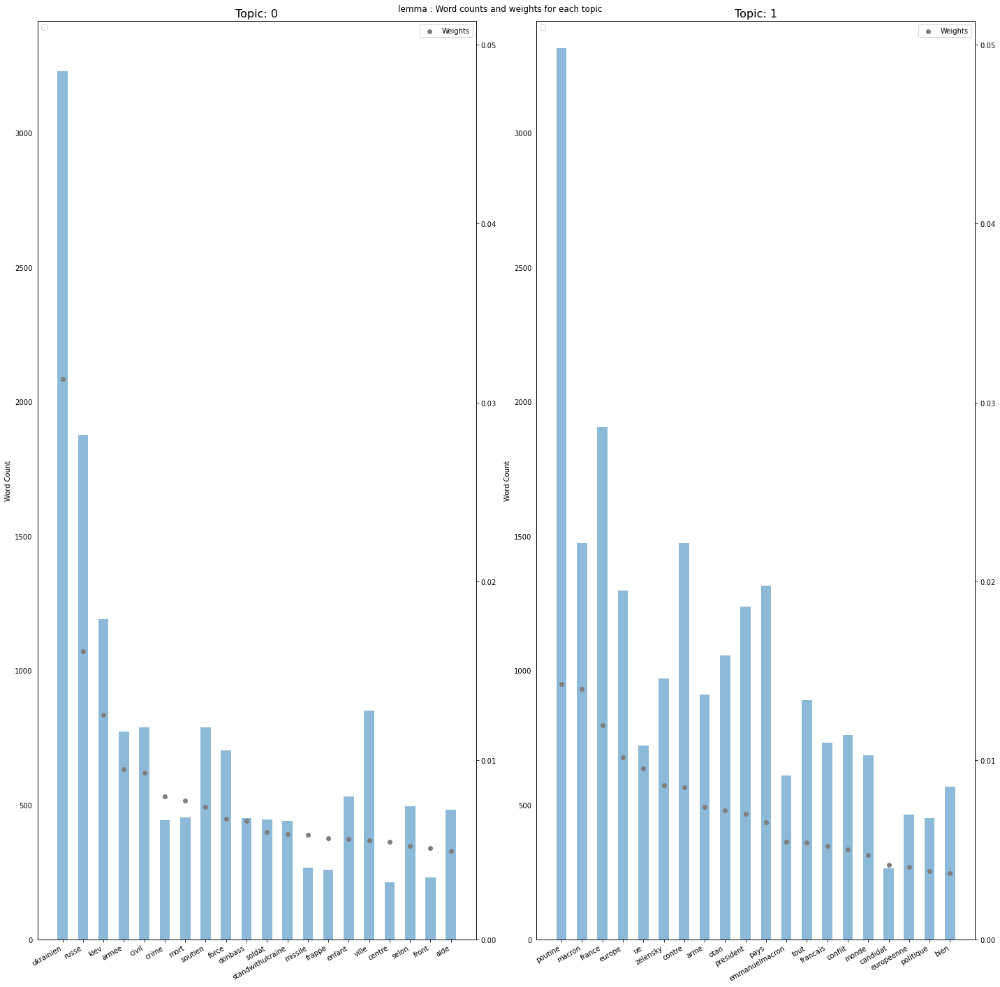

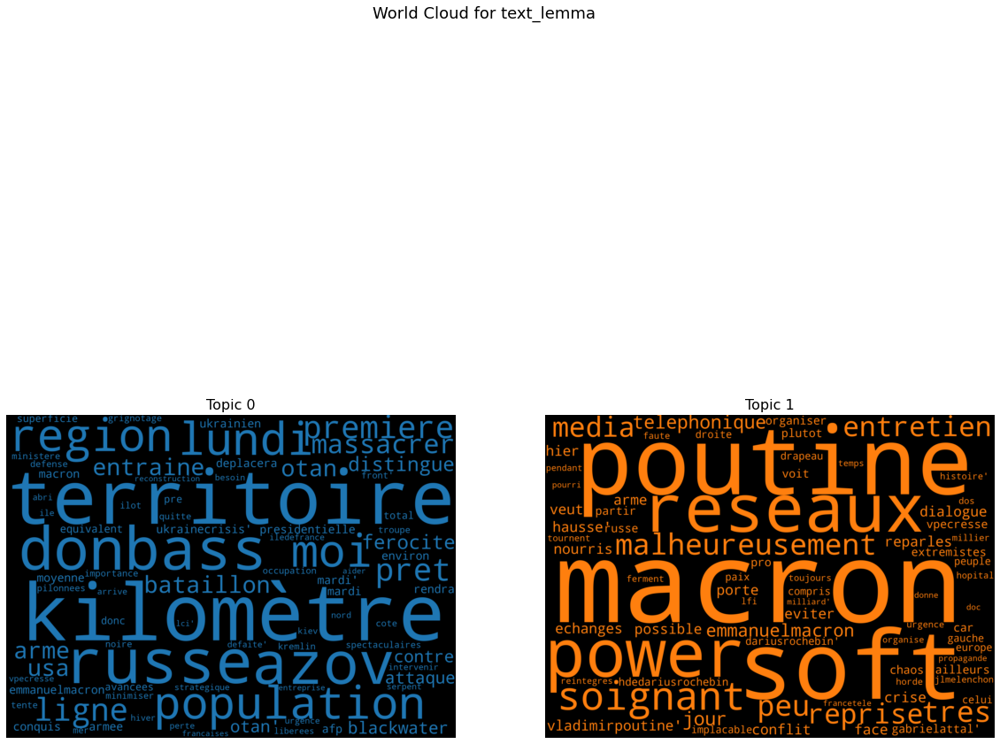

In [104]:
run_all(df_prepro.copy(deep=True), "text_lemma", "lemma", True)

===== Method : lemma =====
... Running bag of words
... Running lda with 3 topics
=== LDA model with 3 topics took : 0.9 minutes
Topic: 0 -> Words: 0.038*"ukrainien" + 0.020*"russe" + 0.015*"kiev" + 0.012*"soutien" + 0.011*"civil" + 0.010*"crime" + 0.009*"mort" + 0.009*"amp" + 0.008*"force" + 0.008*"donbass"
Topic: 1 -> Words: 0.024*"france" + 0.017*"europe" + 0.016*"contre" + 0.015*"ue" + 0.013*"pays" + 0.012*"arme" + 0.012*"otan" + 0.010*"francais" + 0.009*"emmanuelmacron" + 0.008*"conflit"
Topic: 2 -> Words: 0.029*"poutine" + 0.028*"macron" + 0.017*"zelensky" + 0.014*"president" + 0.012*"armee" + 0.010*"an" + 0.010*"tout" + 0.009*"monde" + 0.008*"candidat" + 0.008*"grand"
=== Coherence Score: 0.25
... Running lda visualization
... Running lda visualization


C:\Users\vnarv\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



... Running dominant topics


C:\Users\vnarv\PycharmProjects\twitter_text_mining\src\model\tools_modelling.py:121: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\vnarv\PycharmProjects\twitter_text_mining\src\model\tools_modelling.py:121: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Format topics took 6.0 minutes


C:\Users\vnarv\PycharmProjects\twitter_text_mining\src\model\tools_modelling.py:200: UserWarning:

FixedFormatter should only be used together with FixedLocator

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


... Graph topics and keywords


C:\Users\vnarv\PycharmProjects\twitter_text_mining\src\model\tools_modelling.py:200: UserWarning:

FixedFormatter should only be used together with FixedLocator

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
C:\Users\vnarv\PycharmProjects\twitter_text_mining\src\model\tools_modelling.py:200: UserWarning:

FixedFormatter should only be used together with FixedLocator

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


... Graph word cloud for each topic

 Total running time: 7.511346121629079 minutes


,index,text,username,text_lemma,document_no,dominant_topic,topic_perc_contrib,keywords,tokens
tweet_id,,,,,,,,,
1488433061196812291,0,"voilà l'info, malheureusement très peu reprise...",tcabarrus,malheureusement tres peu reprise media entreti...,0,2,0.4774,"poutine, macron, zelensky, president, armee, a...","[malheureusement, tres, peu, reprise, media, e..."
1488447673883676672,1,#ukraine face à poutine ... macron hausse le t...,lapin47,face poutine macron hausse,1,1,0.4128,"france, europe, contre, ue, pays, arme, otan, ...","[face, poutine, macron, hausse]"
1488493240475078658,2,crise en #ukraine : « emmanuel #macron et vlad...,FaireEnsembleEM,crise macron poutine reparles hier dialogue ec...,2,1,0.6192,"france, europe, contre, ue, pays, arme, otan, ...","[crise, macron, poutine, reparles, hier, dialo..."
1488502446771081216,3,la #russie c'est l'équivalent du pib de l'ital...,BrunoRetailleau,equivalent pib italie attention sanction pourr...,3,1,0.5702,"france, europe, contre, ue, pays, arme, otan, ...","[equivalent, pib, italie, attention, sanction,..."
1488511509961527302,4,crise en #ukraine : voilà pourquoi il faut sor...,f_philippot,crise pourquoi sortir piege atlantiste refuser...,4,1,0.5226,"france, europe, contre, ue, pays, arme, otan, ...","[crise, pourquoi, sortir, piege, atlantiste, r..."
...,...,...,...,...,...,...,...,...,...
1542967067611127813,19934,c'est magnifique et tellement émouvant 🥰🇺🇦🇪🇺 #...,Anna78__,magnifique tellement emouvant europe,19529,1,0.4146,"france, europe, contre, ue, pays, arme, otan, ...","[magnifique, tellement, emouvant, europe]"
1542963887175335937,19935,👉 guerre un #ukraine : que faire pour aider le...,LCI,aider population vpecresse urgence hiver arriv...,19530,2,0.3891,"poutine, macron, zelensky, president, armee, a...","[aider, population, vpecresse, urgence, hiver,..."
1542971236459888641,19936,👉 guerre en #ukraine : le soft power des résea...,LCI,soft power reseaux vpecresse organiser chaos p...,19531,0,0.4193,"ukrainien, russe, kiev, soutien, civil, crime,...","[soft, power, reseaux, vpecresse, organiser, c..."


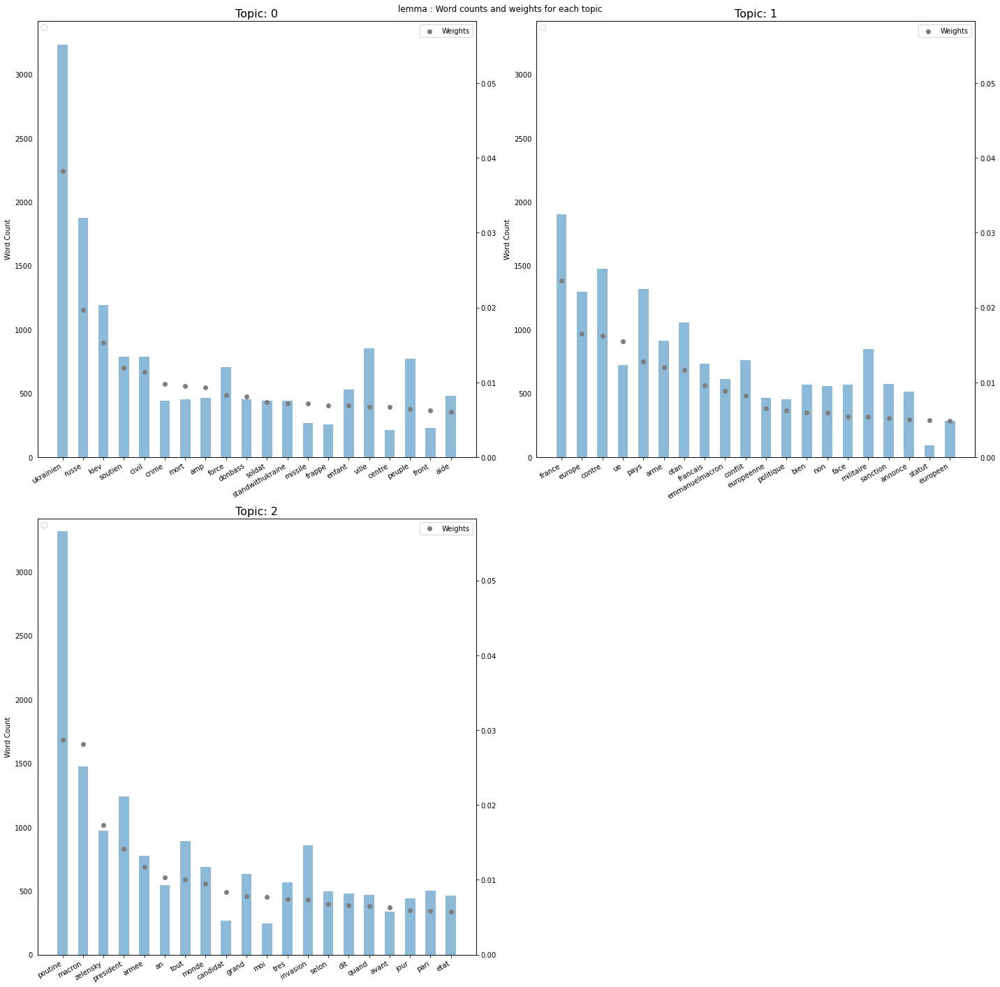

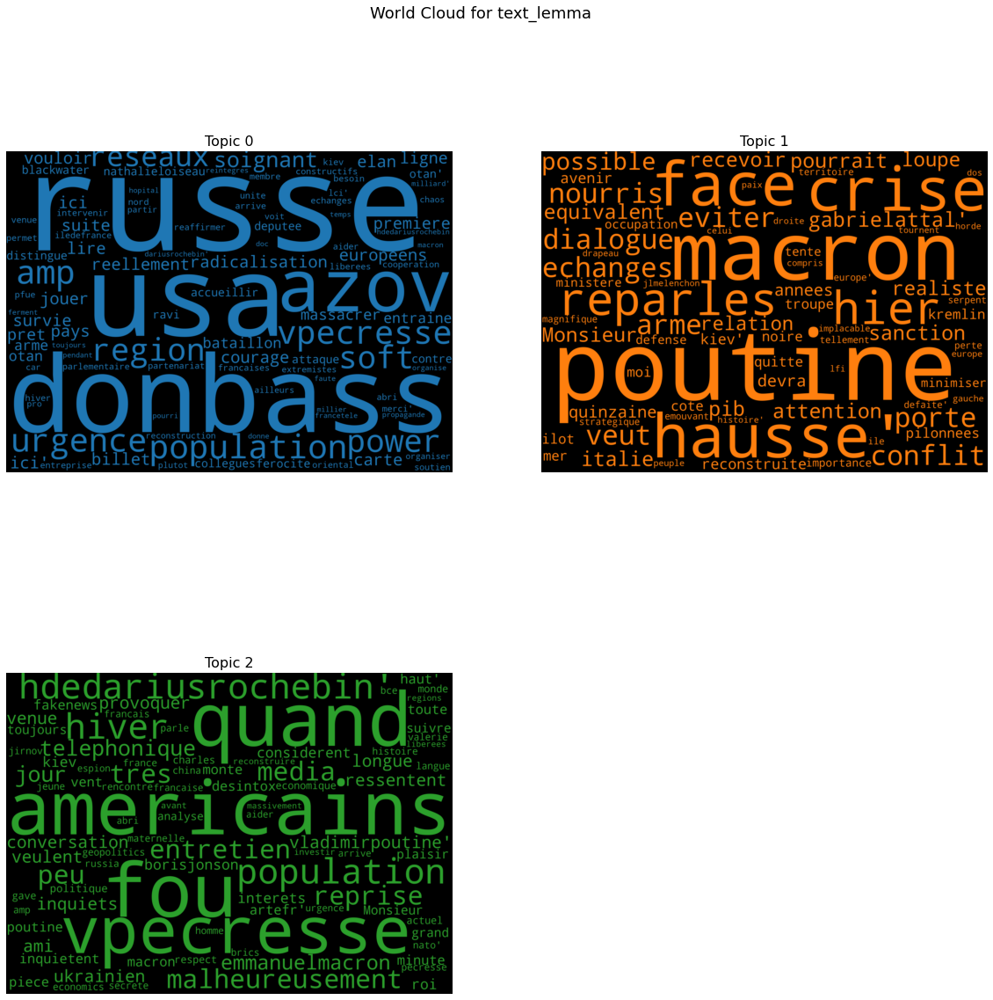

In [106]:
run_all(df_prepro.copy(deep=True), "text_lemma", "lemma", False, 3)

In [ ]:
df_lemma_2topics = pd.read_csv(path + "output/dominant_topics_lemma_2topics.csv", sep=";")
filter_columns = ["text", "username", "dominant_topic",
                 "topic_perc_contrib", "keywords"]

In [ ]:
df_lemma_2topics = df_lemma_2topics[filter_columns]
for i in df_lemma_2topics["dominant_topic"].unique():
    display(df_lemma_2topics[
        df_lemma_2topics["dominant_topic"]==i
    ].sort_values(by=["dominant_topic",
                      "topic_perc_contrib"], ascending=[True, False]).head(20))

In [ ]:
df_lemma_3topics = pd.read_csv(path + "output/dominant_topics_lemma_3topics.csv", sep=";")
df_lemma_3topics = df_lemma_3topics[filter_columns]
for i in df_lemma_3topics["dominant_topic"].unique():
    display(df_lemma_3topics[df_lemma_3topics[
        "dominant_topic"]==i
                            ].sort_values(by=["dominant_topic",
                                              "topic_perc_contrib"], ascending=[True, False]).head(20))

### Autres modèles testés mais pas retenus

In [ ]:
run_all(data.copy(deep=True), "text_stem", "stem", True)
run_all(data.copy(deep=True), "text_stem", "stem", False, 2)
run_all(data.copy(deep=True), "text_stem", "stem", False, 4)
run_all(data.copy(deep=True), "text_lemma_bigram", "lemma_bigram", True)
run_all(data.copy(deep=True), "text_lemma_bigram", "lemma_bigram", False, 3)
run_all(data.copy(deep=True), "text_lemma_bigram", "lemma_bigram", False, 4)
run_all(data.copy(deep=True), "text_stem_bigram", "stem_bigram", True)
run_all(data.copy(deep=True), "text_stem_bigram", "stem_bigram", False, 2)
run_all(data.copy(deep=True), "text_stem_bigram", "stem_bigram", False, 5)
run_all(data.copy(deep=True), "text_lemma_trigram", "lemma_trigram", True)
run_all(data.copy(deep=True), "text_lemma_trigram", "lemma_trigram", False, 3)
run_all(data.copy(deep=True), "text_stem_trigram", "stem_trigram", True)
run_all(data.copy(deep=True), "text_stem_trigram", "stem_trigram", False, 3)
run_all(data.copy(deep=True), "text_stem_trigram", "stem_trigram", False, 4)